# Project Name - Netflix Movies and TV Shows

## Project Type - Exploratory Data Analysis (EDA) / Clustering & Segmentation / Text Analysis & Preprocessing /Business Analytics

## Contribution - Individual

![SNOWFALL](www.netflix.com.png)

### GitHub Link - https://github.com/Karan2988/Labmentix

# Problem Statement: Netflix Content Analysis and Clustering

With an extensive and diverse catalog, Netflix faces challenges in efficiently categorizing, recommending, and analyzing viewer preferences. The sheer volume of data makes it difficult to identify meaningful patterns that can enhance content discovery, user engagement, and strategic decision-making.
This project aims to address the following key challenges:
- Content Categorization: How can clustering techniques help group similar movies and TV shows based on attributes like genre, duration, and ratings?
- Dimensionality Reduction: Can PCA improve clustering accuracy by reducing high-dimensional feature space?
- Text-Based Insights: How can text preprocessing and vectorization uncover trends in content descriptions and titles?
- Business Impact: What insights can be derived to optimize recommendations and improve Netflix’s content strategy?
By leveraging EDA, clustering algorithms, and advanced visualization techniques, this project seeks to provide data-driven solutions for better content segmentation and strategic planning.


# Business Objective: Enhancing Content Categorization and Strategic Insights for Netflix

The primary objective of this project is to analyze and categorize Netflix’s content catalog using data-driven techniques to improve content discovery, user engagement, and strategic decision-making.
Key Goals:

Optimized Segmentation:

- Use clustering techniques (K-Means, hierarchical clustering, PCA) to group similar movies and TV shows.
- Identify patterns in genre, duration, ratings, and regional availability to enhance content classification.
  
Improved Recommendation Strategies:
  
- Extract insights from text-based features (titles, descriptions, genres) using TF-IDF and Bag of Words.
- Help streaming platforms refine personalized recommendations based on content similarities.

Data-Driven Decision Making:
  
- Provide visual analytics to support business strategies for content acquisition and marketing.
- Identify trends in popular genres, regional preferences, and audience engagement.
  
Enhancing User Experience:
  
- Improve content discoverability by grouping similar shows/movies for better navigation.
- Assist in multilingual content analysis to understand global audience preferences.
  
By leveraging exploratory data analysis, clustering, and text analytics, this project aims to provide actionable insights that can help Netflix and similar streaming platforms optimize their content strategy and improve user engagement.


# General Guidelines for Netflix Data Analysis Project

To ensure a structured and effective approach to your project, follow these general guidelines:
1. Data Collection & Preprocessing
- Gather Netflix dataset from reliable sources.
- Handle missing values, duplicates, and inconsistencies in the dataset.
- Perform text preprocessing (stopword removal, case normalization, regex cleaning) for textual features.
2. Exploratory Data Analysis (EDA)
- Visualize genre distribution, content availability, and ratings trends using Seaborn and Matplotlib.
- Identify patterns in movie durations, release years, and regional preferences.
- Generate word clouds to analyze common themes in content descriptions.
3. Clustering & Dimensionality Reduction
- Apply K-Means, hierarchical clustering, and Silhouette Score to segment content.
- Use PCA to reduce dimensionality and improve clustering accuracy.
- Validate clusters using Elbow Method and silhouette analysis.
4. Business Insights & Recommendations
- Identify content trends that can help optimize Netflix’s recommendation system.
- Provide data-driven insights for content acquisition and marketing strategies.
- Explore multilingual content analysis to understand global audience preferences.
5. Presentation & Documentation
- Ensure professional and visually appealing charts for clarity.
- Structure findings in a well-documented report with actionable insights.
- Prepare a clear and engaging presentation for stakeholders at Labmentix.


### Let's Begin !

# 1. Know Your Data

Import Libraries

In [4]:
# Import Libraries

# libraries that are used for analysis and visualization
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import re
%matplotlib inline

# Word Cloud library
from wordcloud import WordCloud, STOPWORDS

# libraries used to process textual data
import string
string.punctuation
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.stem.snowball import SnowballStemmer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA

# libraries used to implement clusters
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc

# libraries that are used to construct a recommendation system
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

# Library of warnings would assist in ignoring warnings issued
import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\patil\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [12]:
# Load Dataset
netflix_df = pd.read_csv("NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv")

In [13]:
# Dataset First Look
netflix_df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


In [17]:
# Dataset Rows & Columns count
print(netflix_df.shape)
print(f'number of rows : {netflix_df.shape[0]} ')
print(f'number of columns : {netflix_df.shape[1]}')

(7787, 12)
number of rows : 7787 
number of columns : 12


In [19]:
# Dataset Info
netflix_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


In [21]:
# Dataset Duplicate Value Count
duplicate_rows = netflix_df[netflix_df.duplicated()]
print(f"Total duplicate rows: {duplicate_rows.shape[0]}")

Total duplicate rows: 0


In [23]:
# Missing Values/Null Values Count
missing_values=netflix_df.isnull().sum()
missing_values

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64

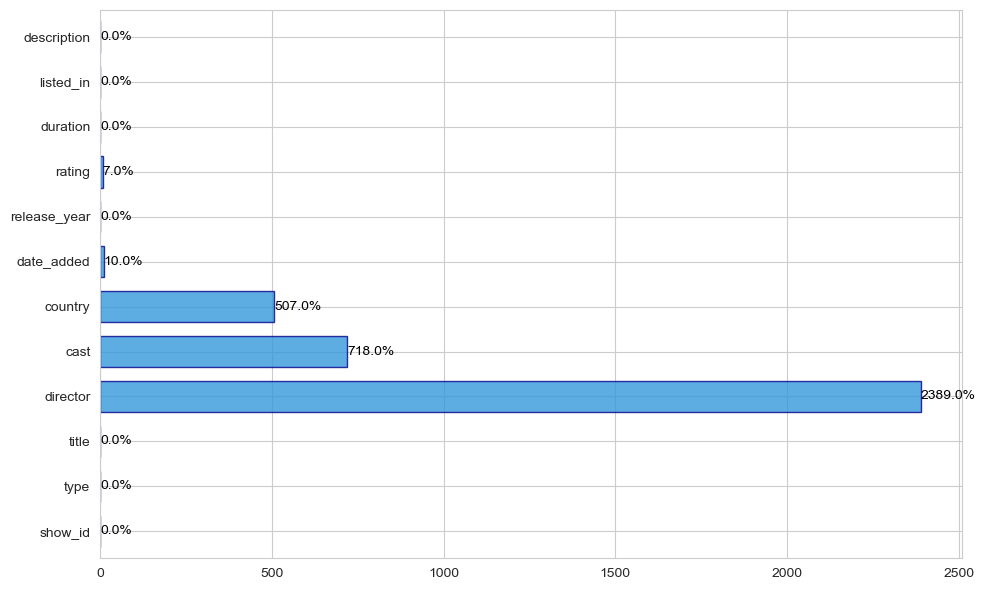

In [25]:
# Visualizing the missing values
# Set style for a cleaner look
sns.set_style("whitegrid")
plt.figure(figsize=(10, 6))

# Customize the bar plot
ax = missing_values.plot(
    kind='barh', 
    color='#3498db',  # Professional blue
    edgecolor='darkblue', 
    alpha=0.8,
    width=0.7
)
# Add value annotations on bars
for i, (name, pct) in enumerate(missing_values.items()):
    ax.text(
        pct + 0.5,  # Offset for readability
        i,
        f"{pct:.1f}%",  # Format to 1 decimal place
        va='center',
        fontsize=10,
        color='black'
    )

# Tight layout to prevent label cutoff
plt.tight_layout()
plt.show()

### What did you know about your dataset?

Netflix Dataset Analysis: Clustering and Recommendation System
This project focuses on analyzing a dataset from the online streaming industry, specifically Netflix, to develop clustering methods and a content-based recommendation system.
Clustering Overview
Clustering is a machine learning technique used to group similar data points together. A clustering algorithm identifies natural groupings within a dataset without prior knowledge of the clusters. This helps uncover patterns in content categorization, aiding in recommendation systems and strategic insights.
Dataset Summary
- Size: 7,787 rows × 12 columns
- Missing Values: Present in director, cast, country, date_added, and rating columns
- Duplicates: No duplicate entries


# 2. Understanding Variables

In [29]:
# Dataset Columns
netflix_df.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [31]:
# Dataset Describe
netflix_df.describe()

,release_year
count,7787.000000
mean,2013.932580
std,8.757395
min,1925.000000
25%,2013.000000
50%,2017.000000
75%,2018.000000
max,2021.000000


### Variables Description

1.show_id : Unique ID

2.type : Identifier - Movie/Show

3.title : Title of the Movie/Show

4.director : Director of the Movie/Show

5.cast : Actors involved in the Movie/Show

6.country : Country where the Movie/Show was produced

7.date_added : Date it was added on Netflix

8.release_year : Actual Release year of the Movie/Show

9.rating : TV Rating of the Movie/Show

10.duration : Total Duration - in minutes or number of seasons

11.listed_in : Genre

12.description : The Summary description

In [34]:
# Check Unique Values for each variable.
for i in netflix_df.columns.tolist():
  print("No. of unique values in",i,"is",netflix_df[i].nunique())

No. of unique values in show_id is 7787
No. of unique values in type is 2
No. of unique values in title is 7787
No. of unique values in director is 4049
No. of unique values in cast is 6831
No. of unique values in country is 681
No. of unique values in date_added is 1565
No. of unique values in release_year is 73
No. of unique values in rating is 14
No. of unique values in duration is 216
No. of unique values in listed_in is 492
No. of unique values in description is 7769


# 3. Data Wrangling

Data Wrangling is the process of cleaning, transforming, and organizing raw data into a structured format for analysis. It ensures that data is accurate, consistent, and usable, making it a crucial step before applying machine learning models, clustering techniques, or visualization.

In [37]:
netflix_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


In [39]:
# Convert 'date_added' to datetime format, handling mixed formats
netflix_df['date_added'] = pd.to_datetime(netflix_df['date_added'], errors='coerce')
# Check if any values failed to convert
print(netflix_df['date_added'].isna().sum(), "dates could not be parsed.")

98 dates could not be parsed.


In [41]:
netflix_df.dropna(subset=['date_added'], inplace=True)  # Remove rows with missing dates

In [43]:
netflix_df.isnull().sum()

show_id            0
type               0
title              0
director        2296
cast             710
country          503
date_added         0
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64

In [45]:
# number of values of different categories in 'type'
netflix_df['type'].value_counts()

type
Movie      5377
TV Show    2312
Name: count, dtype: int64

In [277]:
# Handling Missing Values 
netflix_df[['director','cast','country']] = netflix_df[['director','cast','country']].fillna(' ')
netflix_df.dropna(axis=0, inplace=True)

In [278]:
# checking for null values after treating them.
netflix_df.isna().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
dtype: int64

# Handling Outliers

<Figure size 1000x600 with 0 Axes>

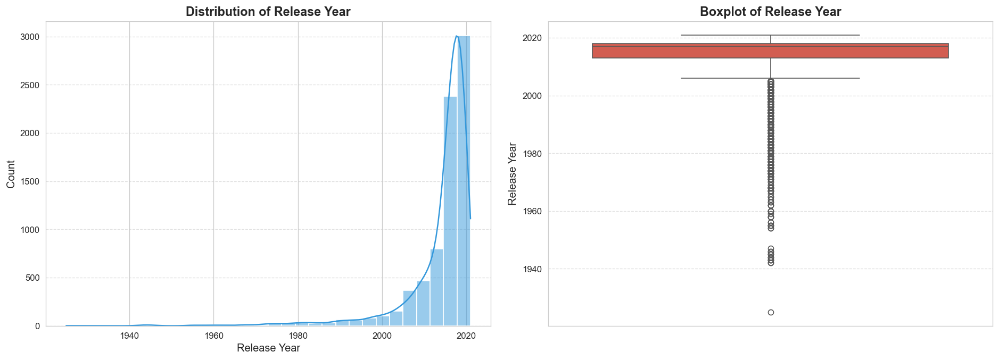

In [280]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set style for a cleaner look
sns.set_style("whitegrid")

# Create a figure with two subplots
fig, ax = plt.subplots(1, 2, figsize=(16, 6), dpi=120)

# Histogram (Distribution Plot) for Release Year
sns.histplot(netflix_df['release_year'], bins=30, kde=True, ax=ax[0], color="#3498db")
ax[0].set_title("Distribution of Release Year", fontsize=14, fontweight="bold")
ax[0].set_xlabel("Release Year", fontsize=12)
ax[0].set_ylabel("Count", fontsize=12)
ax[0].grid(axis="y", linestyle="--", alpha=0.6)

# Boxplot for Outlier Detection (Specify Column)
sns.boxplot(y=netflix_df['release_year'], ax=ax[1], color="#e74c3c")
ax[1].set_title("Boxplot of Release Year", fontsize=14, fontweight="bold")
ax[1].set_ylabel("Release Year", fontsize=12)
ax[1].grid(axis="y", linestyle="--", alpha=0.6)

# Adjust layout for better spacing
plt.tight_layout(pad=2)
plt.show()

# Text Data Preprocessing

Text Preprocessing

Why do we need to clean the text? 

Unlike humans, machines lack an understanding of the unstructured text, so
cleaning the text data is necessary before feeding it to any machine learning algorithm. To understand the
concept better.


In [288]:
netflix_df.head(3)

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."


In [290]:
# Define columns to check
columns_to_check = ['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added', 
                    'rating', 'duration', 'listed_in', 'description']

# Extract special characters from each column separately and combine results
special_chars = set(''.join(netflix_df[columns_to_check].astype(str).apply(
    lambda col: ''.join(re.findall(r'[^a-zA-Z0-9\s]', ' '.join(col)))
)))

print(special_chars)


{'Ł', 'ผ', '@', 'Ø', 'İ', 'ó', 'ę', 'ê', '*', 'À', '시', 'ã', 'ß', 'Ş', '.', 'Ō', '&', 'Ö', 'ب', '́', 'ย', '미', 'ا', 'ū', 'ت', '최', '®', ',', '"', 'ï', 'ă', '„', '?', '의', 'Ò', 'د', 'ö', 'ý', 'ẹ', 'Ź', '‘', 'จ', '=', '사', 'Ü', 'ś', 'ل', 'ł', 'å', 'ò', '반', 'ā', '%', '녀', 'ف', 'ż', 'Ś', 'ي', '-', '영', '잡', '儿', 'น', '는', '️', 'è', 'م', 'Ṣ', 'Ó', '‑', 'â', 'Á', 'ك', '대', '특', '海', '้', 'ơ', 'à', 'า', '+', '¿', '¡', '드', '니', '마', '탄', 'Æ', '강', 'č', 'đ', 'É', '’', '“', "'", 'ą', '!', 'ù', '\u200b', 'þ', 'Ú', 'Č', ':', 'ñ', 'í', '・', '|', '웅', '”', 'ة', '…', 'ش', '´', '์', '#', 'Ñ', 'ş', 'ห', '생', '的', 'ô', '다', 'ń', 'ð', 'ň', '냥', 'ر', 'ÿ', 'ğ', 'ร', 'ه', 'ı', 'û', '~', 'ì', '子', 'ø', '$', 'Ř', '공', 'ú', 'Ż', 'ن', 'แ', 'È', 'Í', 'é', 'õ', '—', 'ع', 'ë', 'ล', '_', '/', 'ä', 'ق', '(', ';', 'î', 'ć', '–', 'เ', 'š', 'ç', 'ü', 'ọ', 'و', '전', ')', 'á', '่', '²', 'æ', 'Þ', 'Ç'}


In [292]:
# Define a function to clean text by removing special characters
def clean_text(text):
    if isinstance(text, str):  # Ensure input is a string
        return re.sub(r'[^a-zA-Z0-9\s]', '', text)
        # Keep only letters, numbers, and spaces
    return text  # Return unchanged if not a string

# Apply the function to multiple columns
columns_to_clean = ['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added', 
                    'rating', 'duration', 'listed_in', 'description']

netflix_df[columns_to_clean] = netflix_df[columns_to_clean].applymap(clean_text)

netflix_df.head() # Check cleaned data

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3,,Joo Miguel Bianca Comparato Michel Gomes Rodol...,Brazil,2020-08-14,2020,TVMA,4 Seasons,International TV Shows TV Dramas TV SciFi Fan...,In a future where the elite inhabit an island ...
1,s2,Movie,719,Jorge Michel Grau,Demin Bichir Hctor Bonilla Oscar Serrano Azali...,Mexico,2016-12-23,2016,TVMA,93 min,Dramas International Movies,After a devastating earthquake hits Mexico Cit...
2,s3,Movie,2359,Gilbert Chan,Tedd Chan Stella Chung Henley Hii Lawrence Koh...,Singapore,2018-12-20,2011,R,78 min,Horror Movies International Movies,When an army recruit is found dead his fellow ...
3,s4,Movie,9,Shane Acker,Elijah Wood John C Reilly Jennifer Connelly Ch...,United States,2017-11-16,2009,PG13,80 min,Action Adventure Independent Movies SciFi Fa...,In a postapocalyptic world ragdoll robots hide...
4,s5,Movie,21,Robert Luketic,Jim Sturgess Kevin Spacey Kate Bosworth Aaron ...,United States,2020-01-01,2008,PG13,123 min,Dramas,A brilliant group of students become cardcount...


In [294]:
# Define columns to check
columns_to_check = ['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added', 
                    'rating', 'duration', 'listed_in', 'description']

# Extract special characters from each column separately and combine results
special_chars = set(''.join(netflix_df[columns_to_check].astype(str).apply(
    lambda col: ''.join(re.findall(r'[^a-zA-Z0-9\s]', ' '.join(col)))
)))

print(special_chars)


{'-'}


### Removing Special Characters from Text Data
In data preprocessing, removing special characters is essential for cleaning textual data and ensuring consistency in analysis. Special characters, including punctuation marks, symbols, and non-English characters, can introduce noise in machine learning models and text-based clustering.
Using regular expressions (regex), we can filter out unwanted characters while preserving meaningful text. The process involves:
- Identifying special characters in the dataset.
- Applying a cleaning function to remove them while keeping letters, numbers, and spaces.
- Ensuring data consistency for further analysis, such as clustering or sentiment analysis.


In [297]:
# creating tags column using all text column which one is used for model building purpose.
netflix_df['text_data'] = netflix_df['director'] + netflix_df['cast'] + netflix_df['country'] + \
                     netflix_df['rating'] + netflix_df['listed_in'] + netflix_df['description']

# checking the first row
test_1=netflix_df['text_data'][0]
test_1

' Joo Miguel Bianca Comparato Michel Gomes Rodolfo Valente Vaneza Oliveira Rafael Lozano Viviane Porto Mel Fronckowiak Sergio Mamberti Zez Motta Celso FrateschiBrazilTVMAInternational TV Shows TV Dramas TV SciFi  FantasyIn a future where the elite inhabit an island paradise far from the crowded slums you get one chance to join the 3 saved from squalor'

In [299]:
# create a set of English stop words
stop_words= stopwords.words('english')

# displaying stopwords
np.array(stop_words)

array(['a', 'about', 'above', 'after', 'again', 'against', 'ain', 'all',
       'am', 'an', 'and', 'any', 'are', 'aren', "aren't", 'as', 'at',
       'be', 'because', 'been', 'before', 'being', 'below', 'between',
       'both', 'but', 'by', 'can', 'couldn', "couldn't", 'd', 'did',
       'didn', "didn't", 'do', 'does', 'doesn', "doesn't", 'doing', 'don',
       "don't", 'down', 'during', 'each', 'few', 'for', 'from', 'further',
       'had', 'hadn', "hadn't", 'has', 'hasn', "hasn't", 'have', 'haven',
       "haven't", 'having', 'he', "he'd", "he'll", 'her', 'here', 'hers',
       'herself', "he's", 'him', 'himself', 'his', 'how', 'i', "i'd",
       'if', "i'll", "i'm", 'in', 'into', 'is', 'isn', "isn't", 'it',
       "it'd", "it'll", "it's", 'its', 'itself', "i've", 'just', 'll',
       'm', 'ma', 'me', 'mightn', "mightn't", 'more', 'most', 'mustn',
       "mustn't", 'my', 'myself', 'needn', "needn't", 'no', 'nor', 'not',
       'now', 'o', 'of', 'off', 'on', 'once', 'only', 'or', 'ot

In [301]:
def lowercase_text(text):
    """Convert all words in the text to lowercase."""
    return " ".join(word.lower() for word in text.split())

In [309]:
# Define the stopword removal function
def remove_stopwords(text, stop_words):
    """Removes stopwords from the given text."""
    words = text.split()
    filtered_words = [word for word in words if word.lower() not in stop_words]
    return " ".join(filtered_words)

# Create a partial function that pre-fixes stop_words argument
remove_stopwords_partial = partial(remove_stopwords, stop_words=stop_words)


# Apply the function to the DataFrame column
netflix_df['text_data'] = netflix_df['text_data'].apply(remove_stopwords_partial)


In [311]:
# applying stopwords function.
netflix_df['text_data'] = netflix_df['text_data'].apply(lowercase_text)

In [313]:
netflix_df.head(1)

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,text_data
0,s1,TV Show,3,,Joo Miguel Bianca Comparato Michel Gomes Rodol...,Brazil,2020-08-14,2020,TVMA,4 Seasons,International TV Shows TV Dramas TV SciFi Fan...,In a future where the elite inhabit an island ...,joo miguel bianca comparato michel gomes rodol...


In [315]:
# checking the first row again
test_2=netflix_df['text_data'][0]
test_2

'joo miguel bianca comparato michel gomes rodolfo valente vaneza oliveira rafael lozano viviane porto mel fronckowiak sergio mamberti zez motta celso frateschibraziltvmainternational tv shows tv dramas tv scifi fantasyin future elite inhabit island paradise far crowded slums get one chance join 3 saved squalor'

In [317]:
# Checking the length of both variables
len_test_1 = len(test_1)
len_test_2 = len(test_2)

# Print the lengths
print(f"Length of test_1: {len_test_1}")
print(f"Length of test_2: {len_test_2}")

# Compare the lengths
if len_test_1 == len_test_2:
    print("Both have the same length.")
else:
    print("The lengths are different.")

Length of test_1: 352
Length of test_2: 310
The lengths are different.


### Removing Punctuations

Punctuation removal is an essential step in text preprocessing for Natural Language Processing (NLP) and machine learning tasks. It helps eliminate unnecessary symbols while preserving meaningful words and spaces. This improves text consistency, making it easier for algorithms to analyze and process data effectively.
Would you like to integrate stemming or lemmatization next?


In [320]:
# function to remove punctuations

def remove_punctuation(text):
    '''a function for removing punctuation'''
    import string
    # replacing the punctuations with no space, which in effect deletes the punctuation marks.
    translator = str.maketrans('', '', string.punctuation)
    # return the text stripped of punctuation marks
    return text.translate(translator)

In [322]:
# applying remove_punctuation function
netflix_df['text_data'] = netflix_df['text_data'].apply(remove_punctuation)

In [324]:
# checking the first row after the process
test_3=netflix_df['text_data'][0]
len_test_3 = len(test_3)

In [326]:
# Print the lengths
print(f"Length of test_1: {len_test_1}")
print(f"Length of test_2: {len_test_2}")
print(f"Length of test_3: {len_test_3}")

Length of test_1: 352
Length of test_2: 310
Length of test_3: 310


### Stemming

Stemming is the process of reducing words to their root form by removing suffixes. It helps in normalizing text for NLP tasks by treating words like "running", "runs", and "ran" as the same base word: "run".


In [329]:
# create an object of stemming function
stemmer = SnowballStemmer("english")

# define a function to apply stemming using SnowballStemmer
def stemming(text):    
    '''a function which stems each word in the given text'''
    text = [stemmer.stem(word) for word in text.split()]
    return " ".join(text)

In [331]:
# appying stemming function
netflix_df['text_data'] = netflix_df['text_data'].apply(stemming)

In [332]:
# checking the first row after the process
test_4=netflix_df['text_data'][0]
len_test_4 = len(test_4)
# Print the lengths
print(f"Length of test_1: {len_test_1}")
print(f"Length of test_2: {len_test_2}")
print(f"Length of test_3: {len_test_3}")
print(f"Length of test_3: {len_test_4}")

Length of test_1: 352
Length of test_2: 310
Length of test_3: 310
Length of test_3: 290


### Text Vectorization

Text vectorization is the process of converting textual data into numerical representations for machine learning models. It transforms words or sentences into vectors that algorithms can process. Common techniques include Bag of Words (BoW), TF-IDF (Term Frequency-Inverse Document Frequency), and Word Embeddings (Word2Vec, GloVe).


In [334]:
# create the object of tfid vectorizer
tfidf = TfidfVectorizer(stop_words='english', lowercase=False, max_features = 10000)   # max features = 20000 to prevent system from crashing

# fit the vectorizer using the text data
tfidf.fit(netflix_df['text_data'])

# collect the vocabulary items used in the vectorizer
dictionary = tfidf.vocabulary_.items()

In [335]:
print(len(dictionary)) #number of independet features created from "text_data" columns

10000


In [336]:
# convert vector into array form for clustering
vector = tfidf.transform(netflix_df['text_data']).toarray()

# summarize encoded vector
print(vector)
print(f'shape of the vector : {vector.shape}') 
print(f'datatype : {type(vector)}')
     

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
shape of the vector : (7682, 10000)
datatype : <class 'numpy.ndarray'>


### Dimensionality Reduction

Dimensionality reduction is the process of reducing the number of features or variables in a dataset while retaining its essential information. It helps in visualization, noise reduction, and improving model efficiency by eliminating redundant or irrelevant features.

Common techniques include:
- Principal Component Analysis (PCA) – Projects data onto fewer dimensions while preserving variance.


In [343]:
# using PCA to reduce dimensionality
pca = PCA(random_state=42)
pca.fit(vector)

PCA(random_state=42)

In [345]:
print(plt.style.available)  # Lists all valid styles

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


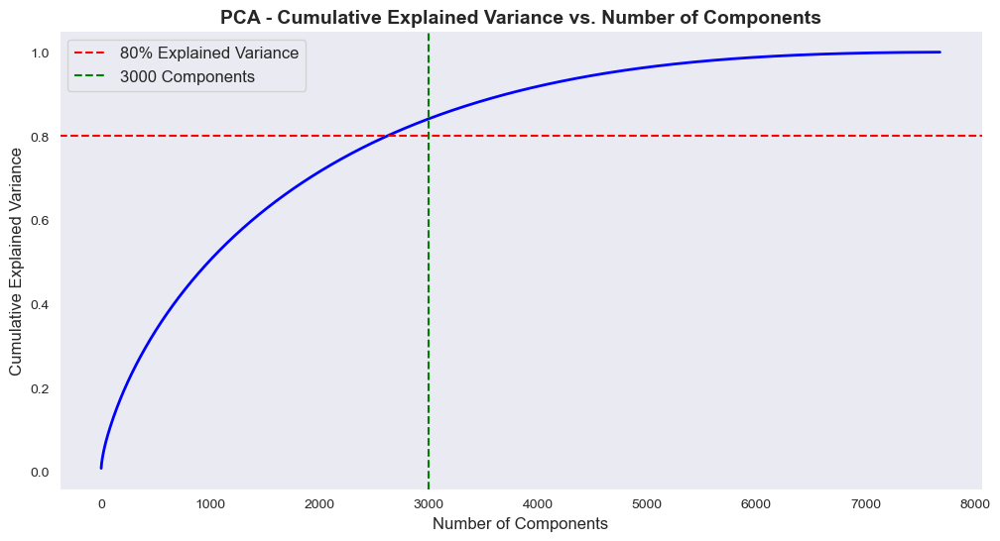

In [347]:
# Set Seaborn style
sns.set_style("dark")

# Create figure
plt.figure(figsize=(12, 6))

# Plot cumulative explained variance
plt.plot(np.cumsum(pca.explained_variance_ratio_), color='blue', linewidth=2)

# Add reference lines
plt.axhline(y=0.8, color='red', linestyle='--', linewidth=1.5, label='80% Explained Variance')
plt.axvline(x=3000, color='green', linestyle='--', linewidth=1.5, label='3000 Components')

# Enhancing labels and title
plt.title('PCA - Cumulative Explained Variance vs. Number of Components', fontsize=14, fontweight='bold')
plt.xlabel('Number of Components', fontsize=12)
plt.ylabel('Cumulative Explained Variance', fontsize=12)

# Remove unnecessary spines for a cleaner look
sns.despine()

# Adding legend
plt.legend(fontsize=12)

# Display the plot
plt.show()

In [349]:
# reducing the dimensions to 3000 using pca
pca = PCA(n_components=3000, random_state=42)
pca.fit(vector)

PCA(n_components=3000, random_state=42)

In [350]:
# transformed features
X = pca.transform(vector)

# shape of transformed vectors
X.shape

(7682, 3000)

### Model Implementation

K-Means Clustering

Model Implementation: K-Means Clustering
K-Means Clustering is an unsupervised machine learning algorithm used to group similar data points into K clusters based on feature similarity. It minimizes the variance within clusters and assigns each data point to the nearest cluster center.


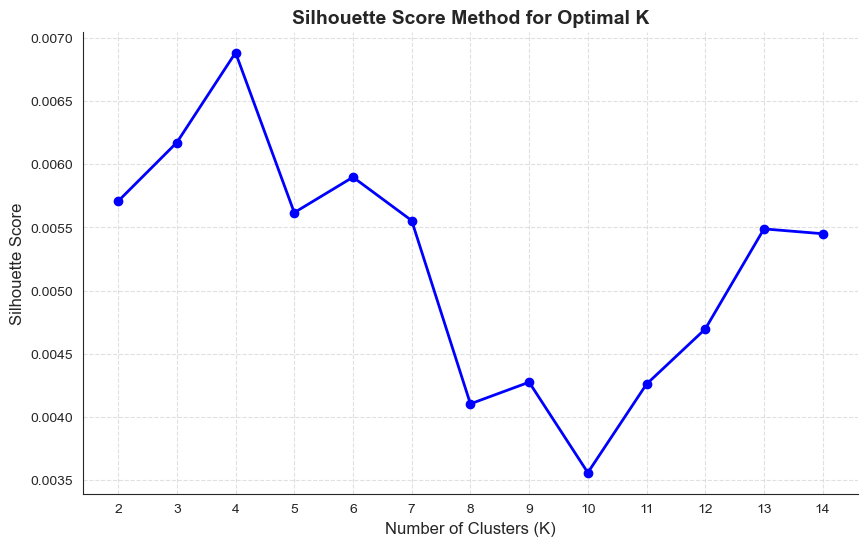

In [363]:
# Set Seaborn style
sns.set_style("white")

# Reduce dimensionality using PCA (recommended for high-dimensional data)
pca = PCA(n_components=3000)  # Adjust components based on explained variance
X_reduced = pca.fit_transform(X)

# Define range of K values
k_values = range(2, 15)  # Silhouette score requires at least 2 clusters
silhouette_scores = []

# Compute silhouette scores for different K values
for k in k_values:
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    labels = kmeans.fit_predict(X_reduced)
    score = silhouette_score(X_reduced, labels)
    silhouette_scores.append(score)

# Plot the Silhouette Score Method graph
plt.figure(figsize=(10, 6))
plt.plot(k_values, silhouette_scores, marker='o', linestyle='-', color='blue', linewidth=2)

# Enhancing visualization
plt.title('Silhouette Score Method for Optimal K', fontsize=14, fontweight='bold')
plt.xlabel('Number of Clusters (K)', fontsize=12)
plt.ylabel('Silhouette Score', fontsize=12)
plt.xticks(k_values)
plt.grid(True, linestyle='--', alpha=0.6)
sns.despine()

# Show plot
plt.show()

The highest Silhouette score is obtained for 4clusters.

Building 4 clusters using the k-means clustering algorithm.

In [367]:
optimal_k = k_values[np.argmax(silhouette_scores)]  # Best K based on highest silhouette score

print(f'highest Silhouette score',optimal_k)

highest Silhouette score 4


In [369]:
kmeans = KMeans(n_clusters=4, init='k-means++', random_state=33)
kmeans.fit(X)

KMeans(n_clusters=4, random_state=33)

In [371]:
# Evaluation metrics - distortion, Silhouette score
kmeans_distortion = kmeans.inertia_
kmeans_silhouette_score = silhouette_score(X, kmeans.labels_)

print((kmeans_distortion, kmeans_silhouette_score))

(6286.047377484454, 0.005292883922217583)


In [373]:
# Adding a kmeans cluster number attribute
netflix_df['kmeans_cluster'] = kmeans.labels_

In [375]:
netflix_df.sample(5)[['type', 'title', 'director', 'cast', 'country', 'rating', 'listed_in', 'description', 'kmeans_cluster']]

,type,title,director,cast,country,rating,listed_in,description,kmeans_cluster
64,TV Show,13 Reasons Why Beyond the Reasons,,Dylan Minnette Katherine Langford Kate Walsh D...,United States,TVMA,Crime TV Shows Docuseries,Cast members writers producers and mental heal...,3
5529,Movie,SGT Will Gardner,Max Martini,Max Martini Omari Hardwick Lily Rabe Elisabeth...,United States,TVMA,Dramas,A homeless vet who has PTSD steals a motorcycl...,3
3747,Movie,Love and Shukla,Jatla Siddartha,Saharsh Kumar Shukla Taneea Rajawat Hima Singh...,India,TVMA,Dramas Independent Movies International Movies,A sexually inexperienced rickshaw driver strug...,0
1675,Movie,Death to 2020,Al Campbell Alice Mathias,Samuel L Jackson Hugh Grant Lisa Kudrow Kumail...,United States,TVMA,Comedies,As the year we all want to end finally does ta...,3
3785,Movie,Love Guaranteed,Mark Steven Johnson,Rachael Leigh Cook Damon Wayans Jr Heather Gra...,United States,TVPG,Comedies Independent Movies Romantic Movies,Sparks fly when a crusading but cashstrapped a...,3


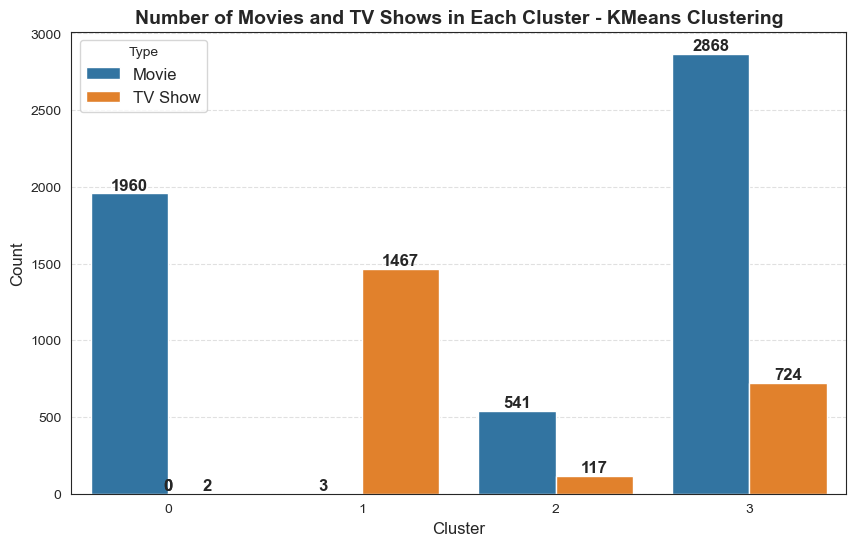

In [377]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set Seaborn style
sns.set_style("white")

# Create the count plot
plt.figure(figsize=(10, 6))
graph = sns.countplot(x='kmeans_cluster', data=netflix_df, hue='type', palette=['#1f77b4', '#ff7f0e'])  # Blue for TV shows, Orange for Movies

# Add title and labels
plt.title('Number of Movies and TV Shows in Each Cluster - KMeans Clustering', fontsize=14, fontweight='bold')
plt.xlabel('Cluster', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.legend(title='Type', fontsize=12)

# Adding value counts on top of bars
for p in graph.patches:
    graph.annotate(format(p.get_height(), '.0f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()),  
                   ha='center', va='bottom', fontsize=12, fontweight='bold')

plt.grid(axis='y', linestyle='--', alpha=0.6)

# Show plot
plt.show()

In [379]:
print(netflix_df.columns)

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description',
       'text_data', 'kmeans_cluster'],
      dtype='object')


Building wordclouds for different clusters in K-Means Clustering

In [382]:
def kmeans_worldcloud(cluster_number, column_name):
  
  '''function for Building a wordcloud for the movie/shows'''

  netflix_df_wordcloud = netflix_df[['kmeans_cluster',column_name]].dropna()
  netflix_df_wordcloud = netflix_df_wordcloud[netflix_df_wordcloud['kmeans_cluster']==cluster_number]
  
  # text documents
  text = " ".join(word for word in netflix_df_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)
  
  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

Cluster 0 - description


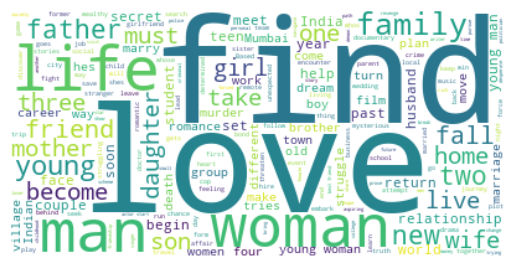

Cluster 1 - description


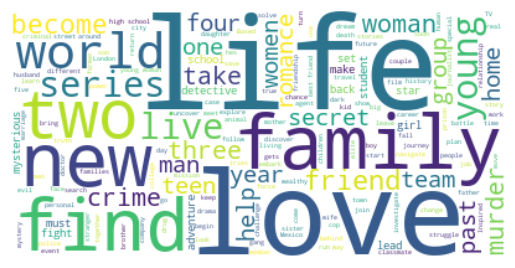

Cluster 2 - description


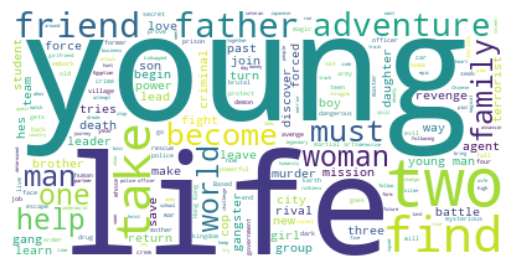

Cluster 3 - description


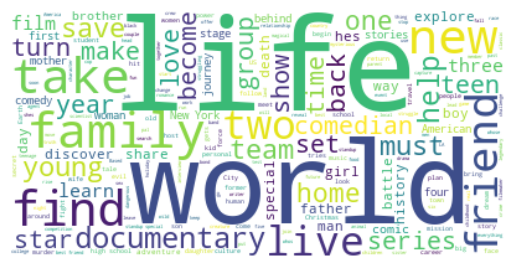

Cluster 0 - cast


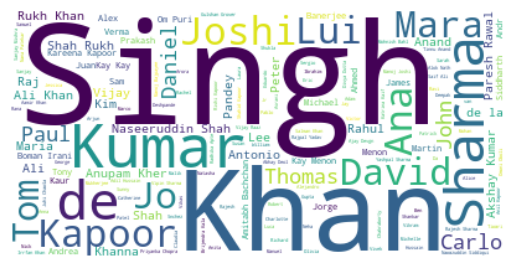

Cluster 1 - cast


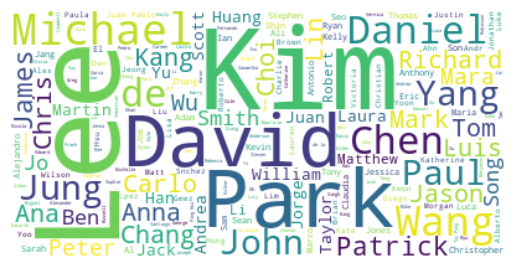

Cluster 2 - cast


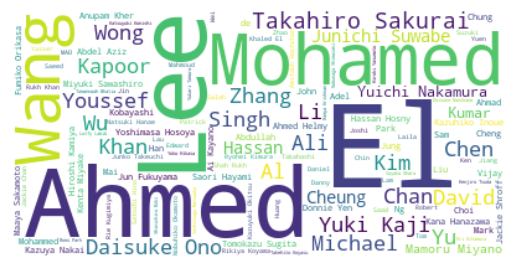

Cluster 3 - cast


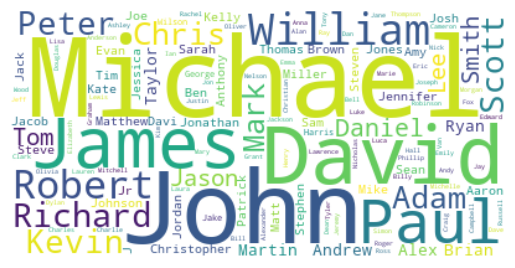

Cluster 0 - director


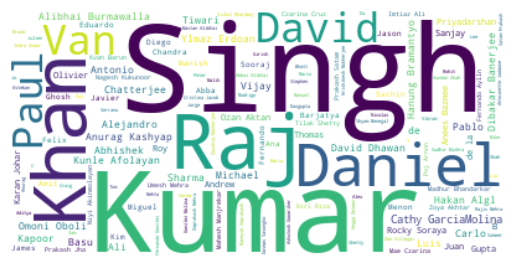

Cluster 1 - director


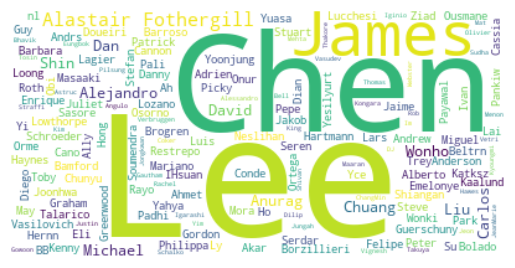

Cluster 2 - director


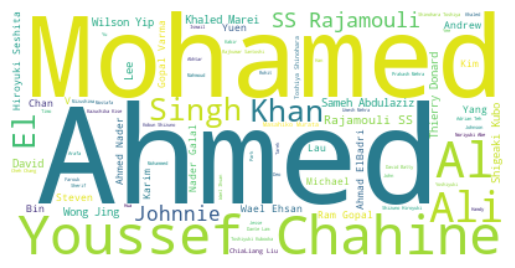

Cluster 3 - director


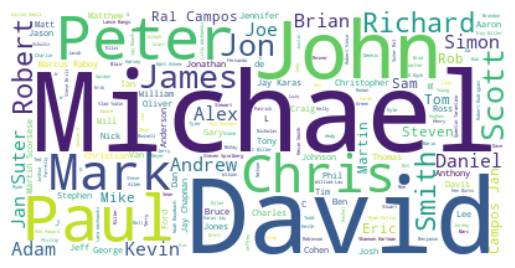

Cluster 0 - listed_in


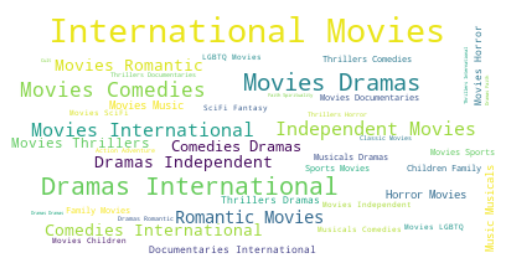

Cluster 1 - listed_in


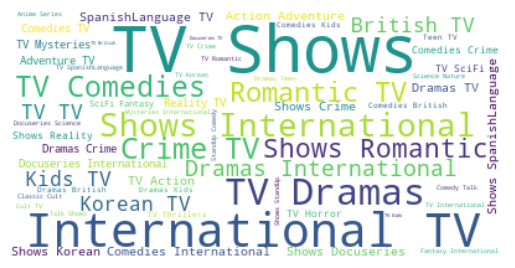

Cluster 2 - listed_in


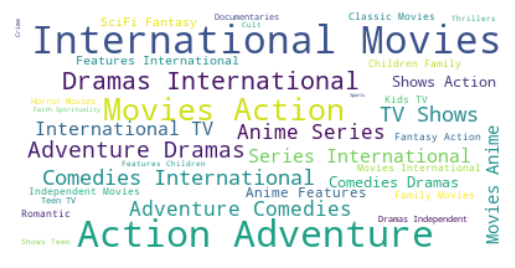

Cluster 3 - listed_in


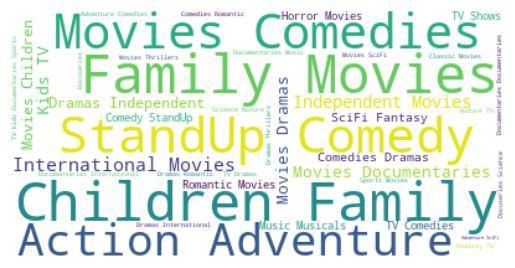

Cluster 0 - country


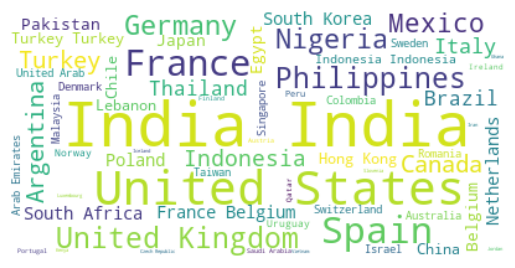

Cluster 1 - country


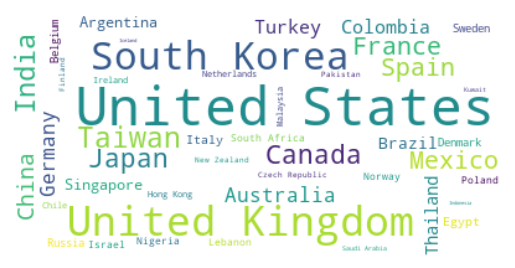

Cluster 2 - country


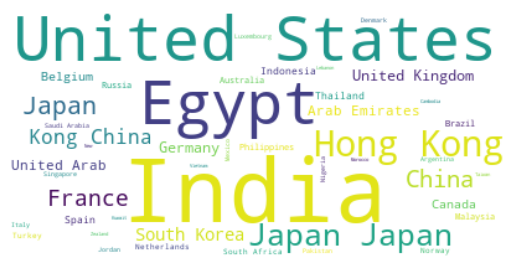

Cluster 3 - country


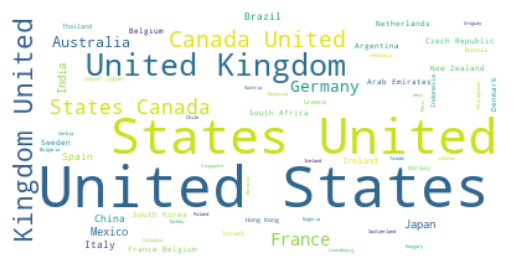

Cluster 0 - title


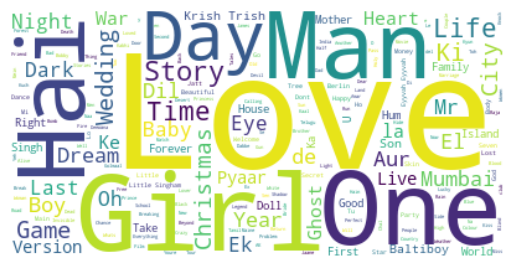

Cluster 1 - title


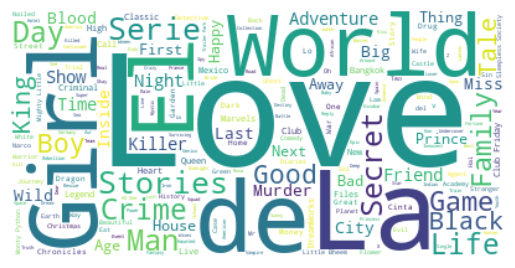

Cluster 2 - title


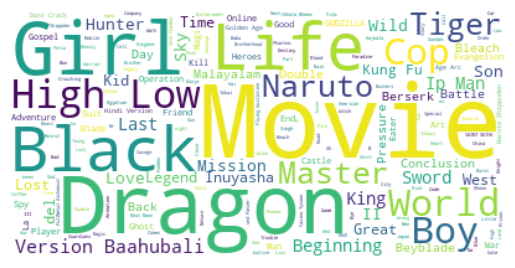

Cluster 3 - title


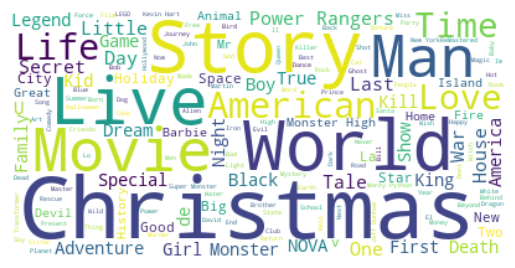

In [388]:
# Define the columns for word cloud generation
columns = ['description', 'cast', 'director', 'listed_in','country','title']

# Loop through clusters and columns
for col in columns:
    for i in range(4):  # Assuming 6 clusters
        print(f'Cluster {i} - {col}')
        kmeans_worldcloud(i, col)


### Hierarchical clustering

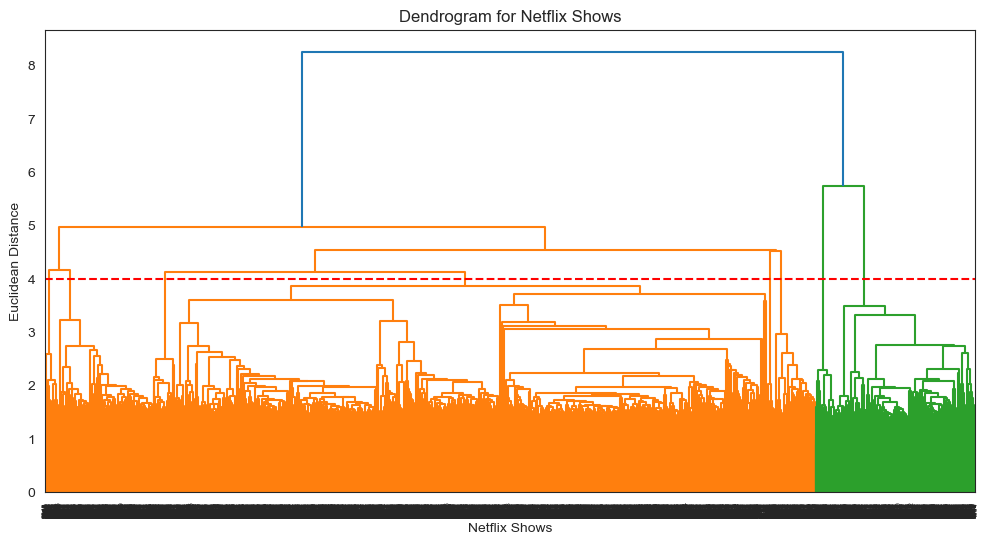

In [391]:
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as shc

# Building a dendrogram to decide the number of clusters
plt.figure(figsize=(12, 6))  # Slightly larger for better readability
dend = shc.dendrogram(shc.linkage(X, method='ward'))

# Adding labels and title
plt.title('Dendrogram for Netflix Shows')
plt.xlabel('Netflix Shows')
plt.ylabel('Euclidean Distance')

# Draw a horizontal line to indicate the cutoff for clusters
plt.axhline(y=4, color='r', linestyle='--')  # Adjust based on dendrogram structure

# Show the plot
plt.show()

At a distance of 4 units, 4 clusters can be built using the agglomerative clustering algorithm.

In [439]:
from sklearn.cluster import AgglomerativeClustering

# Fitting hierarchical clustering model
hierarchical = AgglomerativeClustering(n_clusters=4, linkage='ward')  
hierarchical.fit_predict(X)

array([3, 0, 3, ..., 0, 0, 0], dtype=int64)

In [440]:
# Adding a hierarchical cluster number attribute
netflix_df['hierarchical_cluster'] = hierarchical.labels_

In [441]:
netflix_df.sample(5)[['type', 'title', 'director', 'cast', 'country', 'rating', 'listed_in', 'description', 'hierarchical_cluster']]
     

,type,title,director,cast,country,rating,listed_in,description,hierarchical_cluster
5132,TV Show,Rectify,,Aden Young Abigail Spencer J SmithCameron Clay...,United States,TVMA,Crime TV Shows TV Dramas TV Mysteries,Convicted of rape and murder at age 18 Daniel ...,0
449,TV Show,Amazing Interiors,,,United Kingdom,TVPG,British TV Shows International TV Shows Realit...,Meet eccentric homeowners whose seemingly ordi...,3
6529,TV Show,The Kindness Diaries,,Leon Logothetis,,TVPG,Reality TV,Host Leon Logothetis travels the world with on...,0
1282,TV Show,Charlies Colorforms City,,Jacob Soley Saara Chaudry Tyler Barish Zoe Hat...,United States,TVY,Kids TV,Charlie creates fun stories using different sh...,0
5701,TV Show,Some Assembly Required,,Kolton Stewart Harrison Houde Charlie Storwick...,Canada,TVY,Kids TV TV Comedies,A 14yearold takes ownership of a toy company a...,0


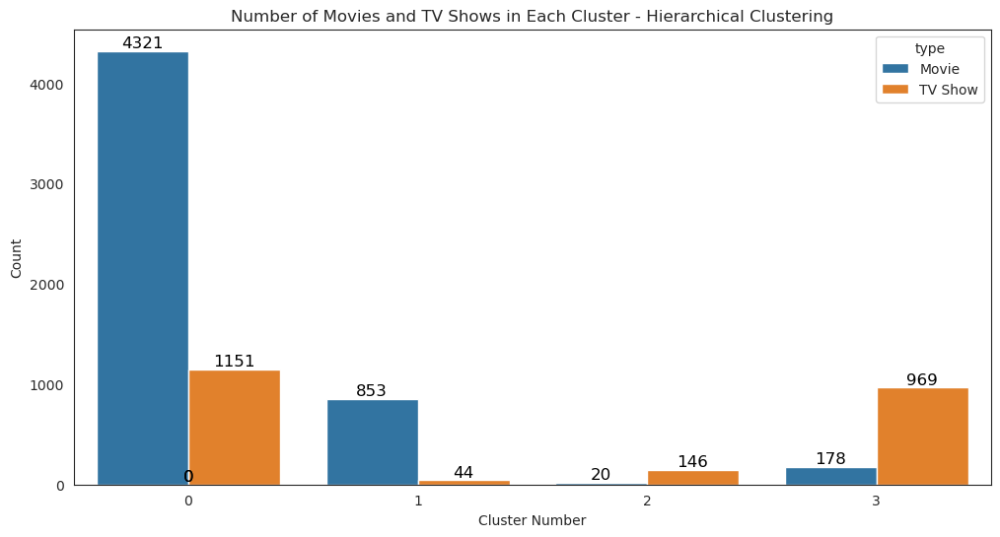

In [445]:
import matplotlib.pyplot as plt
import seaborn as sns

# Creating the count plot
plt.figure(figsize=(12, 6))  # Slightly larger for better readability
graph = sns.countplot(x='hierarchical_cluster', data=netflix_df, hue='type')

# Adding title and labels
plt.title('Number of Movies and TV Shows in Each Cluster - Hierarchical Clustering')
plt.xlabel('Cluster Number')
plt.ylabel('Count')

# Adding value counts on top of bars
for p in graph.patches:
    graph.annotate(format(p.get_height(), '.0f'), 
                   (p.get_x() + p.get_width() / 2, p.get_height()), 
                   ha='center', va='bottom', fontsize=12, color='black')

# Show the plot
plt.show()

Built 4 clusters using the Agglomerative (hierarchical) clustering algorithm.

Building wordclouds for different clusters in hierarchical Clustering

In [452]:
def hierarchical_worldcloud(cluster_number, column_name):
  
  '''function for Building a wordcloud for the movie/shows'''

  netflix_df_wordcloud = netflix_df[['hierarchical_cluster',column_name]].dropna()
  netflix_df_wordcloud = netflix_df_wordcloud[netflix_df_wordcloud['hierarchical_cluster']==cluster_number]
  
  # text documents
  text = " ".join(word for word in netflix_df_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)
  
  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

Cluster 0 - description


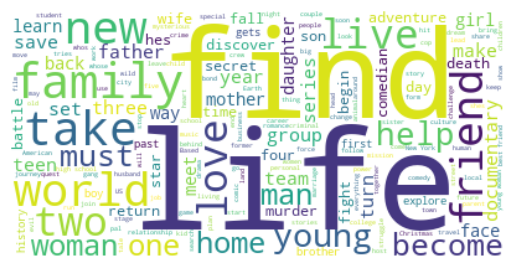

Cluster 1 - description


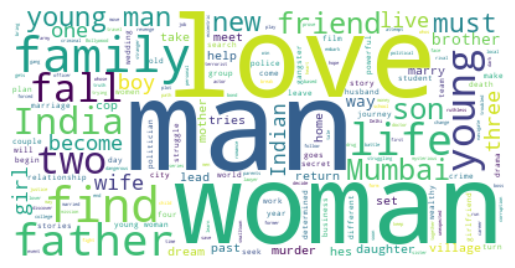

Cluster 2 - description


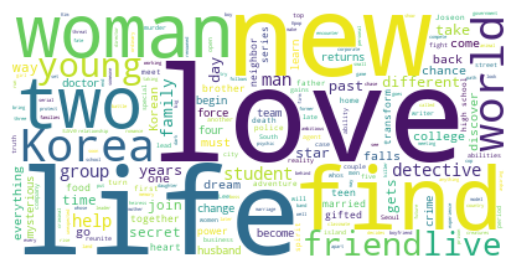

Cluster 3 - description


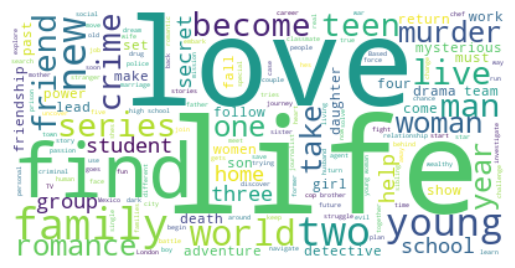

Cluster 0 - cast


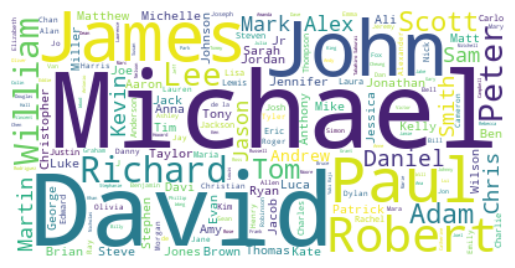

Cluster 1 - cast


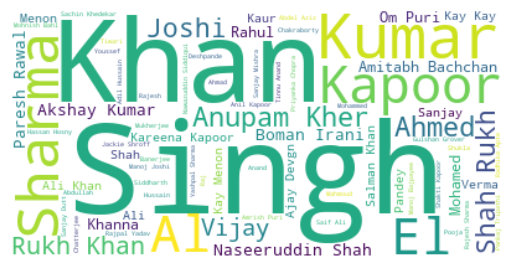

Cluster 2 - cast


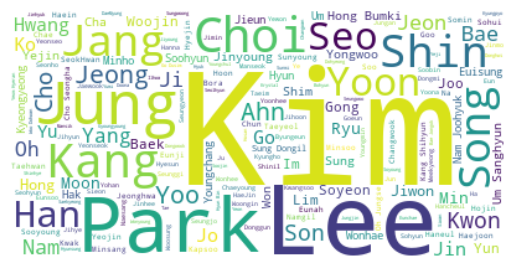

Cluster 3 - cast


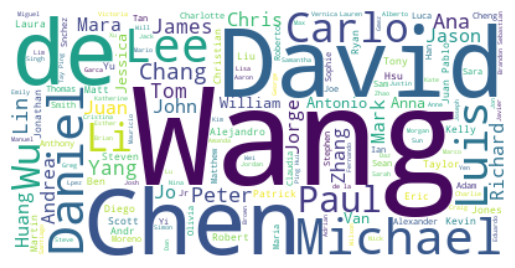

Cluster 0 - director


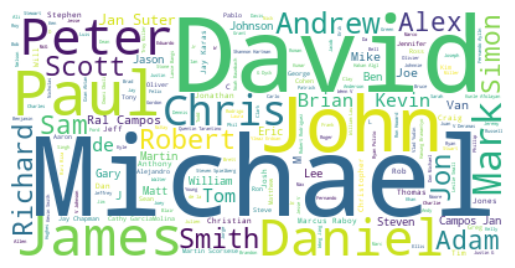

Cluster 1 - director


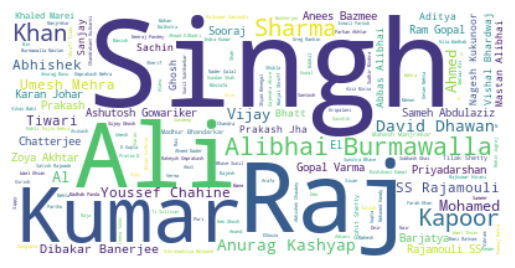

Cluster 2 - director


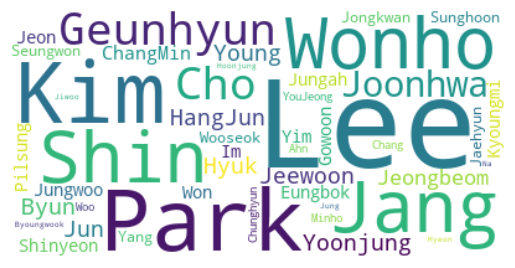

Cluster 3 - director


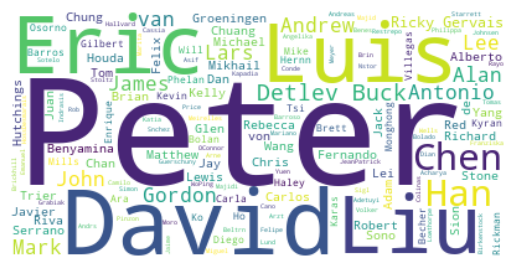

Cluster 0 - listed_in


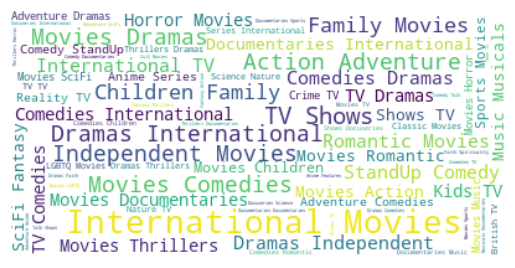

Cluster 1 - listed_in


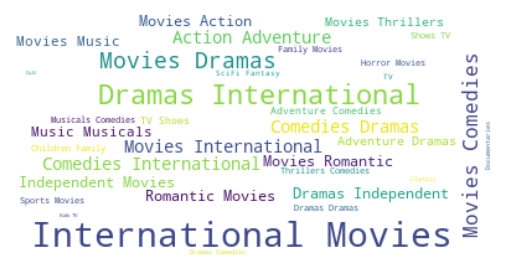

Cluster 2 - listed_in


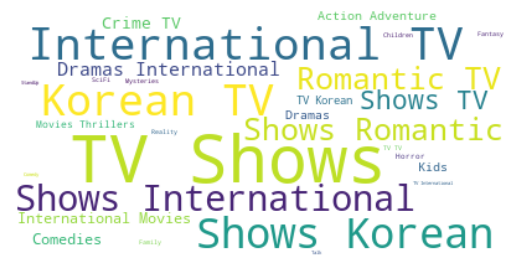

Cluster 3 - listed_in


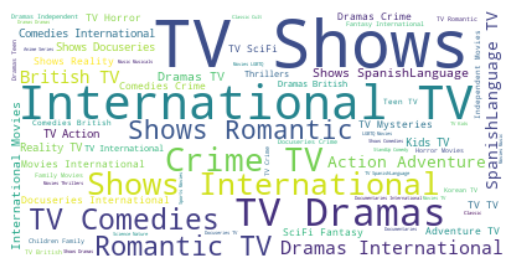

Cluster 0 - country


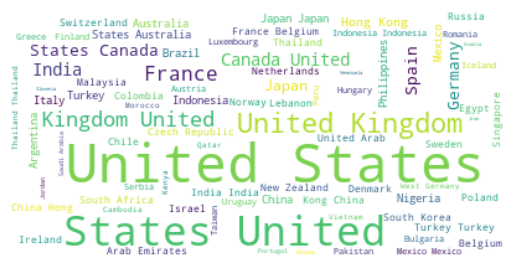

Cluster 1 - country


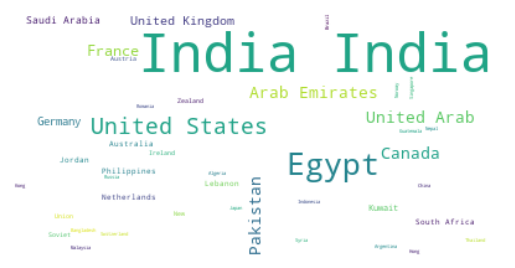

Cluster 2 - country


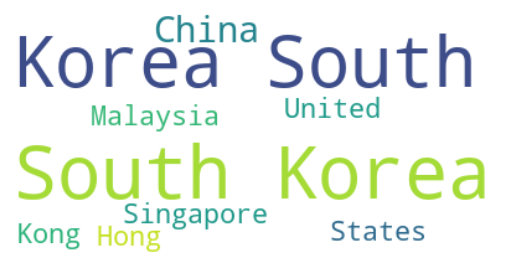

Cluster 3 - country


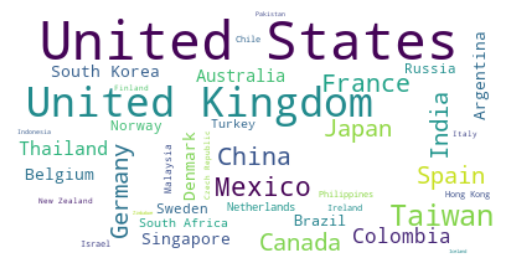

Cluster 0 - title


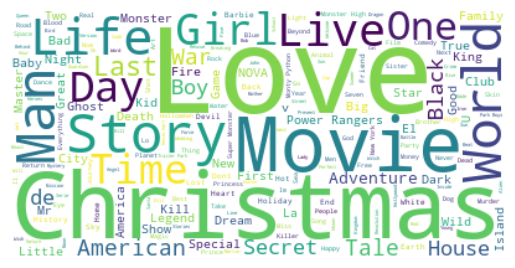

Cluster 1 - title


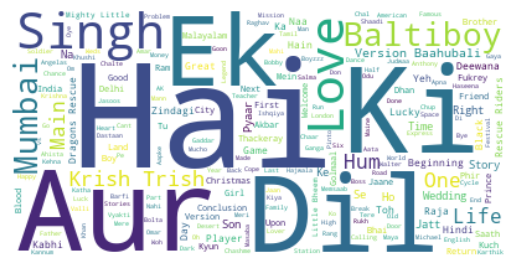

Cluster 2 - title


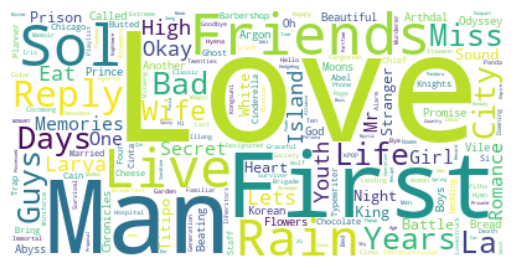

Cluster 3 - title


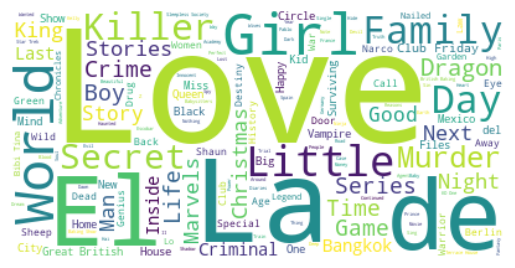

In [454]:
# Define the columns for word cloud generation
columns = ['description', 'cast', 'director', 'listed_in','country','title']

# Loop through clusters and columns
for col in columns:
    for i in range(4):  # Assuming 6 clusters
        print(f'Cluster {i} - {col}')
        hierarchical_worldcloud(i, col)


### Content-Based Recommendation System

A content-based recommender system suggests movies and shows by analyzing their attributes and finding similarities with content the user has previously liked. It relies on features such as genre, director, cast, and description to determine how closely related different items are.

To build a simple content-based recommendation system, we can measure the similarity between shows using cosine similarity. This technique calculates the similarity score by computing the dot product of two feature vectors and dividing it by the product of their magnitudes.


In [456]:
# veryfying index
netflix_df[['show_id', 'title', 'text_data']]

,show_id,title,text_data
0,s1,3,joo miguel bianca comparato michel gome rodolf...
1,s2,719,jorg michel graudemin bichir hctor bonilla osc...
2,s3,2359,gilbert chantedd chan stella chung henley hii ...
3,s4,9,shane ackerelijah wood john c reilli jennif co...
4,s5,21,robert luketicjim sturgess kevin spacey kate b...
...,...,...,...
7782,s7783,Zozo,josef faresimad creidi antoinett turk elia ger...
7783,s7784,Zubaan,mozez singhvicki kaushal sarahjan dia raaghav ...
7784,s7785,Zulu Man in Japan,nasti c tvmadocumentari intern movi music musi...
7785,s7786,Zumbos Just Desserts,adriano zumbo rachel khooaustraliatvpgintern t...


Due to row deletions while handling null values, the index may be misaligned, leading to incorrect similarity calculations.


In [460]:
# defining new dataframe for building recommandation system
recommender_df = netflix_df.copy()

# reseting index
recommender_df.reset_index(inplace=True)

# checking whether or not reset index properly 
recommender_df[['show_id', 'title', 'text_data']]

,show_id,title,text_data
0,s1,3,joo miguel bianca comparato michel gome rodolf...
1,s2,719,jorg michel graudemin bichir hctor bonilla osc...
2,s3,2359,gilbert chantedd chan stella chung henley hii ...
3,s4,9,shane ackerelijah wood john c reilli jennif co...
4,s5,21,robert luketicjim sturgess kevin spacey kate b...
...,...,...,...
7677,s7783,Zozo,josef faresimad creidi antoinett turk elia ger...
7678,s7784,Zubaan,mozez singhvicki kaushal sarahjan dia raaghav ...
7679,s7785,Zulu Man in Japan,nasti c tvmadocumentari intern movi music musi...
7680,s7786,Zumbos Just Desserts,adriano zumbo rachel khooaustraliatvpgintern t...


In [462]:
# dropping show-id and index column
recommender_df.drop(columns=['index', 'show_id'], inplace=True)

In [464]:
X

array([[ 0.15845827, -0.00926933, -0.00806142, ..., -0.00709297,
         0.0094909 , -0.01756711],
       [-0.040374  ,  0.01661097, -0.01698997, ...,  0.00659459,
         0.00337304,  0.00057326],
       [-0.03971443,  0.03037342,  0.05662856, ..., -0.00595254,
         0.00126019, -0.01036952],
       ...,
       [-0.06507567,  0.00367286, -0.07198238, ..., -0.00677394,
        -0.01435299,  0.00791937],
       [ 0.05469018, -0.03175331, -0.03101452, ..., -0.01538664,
        -0.00762652,  0.00033059],
       [-0.07259049, -0.14628109, -0.15202541, ..., -0.00073692,
        -0.00903114, -0.00172583]])

In [466]:
# calculate cosine similarity
similarity = cosine_similarity(X)
similarity

array([[ 1.        ,  0.08058235,  0.02159461, ..., -0.02117836,
         0.00526926, -0.01960958],
       [ 0.08058235,  1.        , -0.00467367, ...,  0.06149841,
        -0.0078091 , -0.01323146],
       [ 0.02159461, -0.00467367,  1.        , ..., -0.0048452 ,
        -0.01133029, -0.01938227],
       ...,
       [-0.02117836,  0.06149841, -0.0048452 , ...,  1.        ,
        -0.00477542,  0.12086599],
       [ 0.00526926, -0.0078091 , -0.01133029, ..., -0.00477542,
         1.        ,  0.03705746],
       [-0.01960958, -0.01323146, -0.01938227, ...,  0.12086599,
         0.03705746,  1.        ]])

In [468]:
def recommend_multiple(movies):
    """
    This function lists the top ten recommended movies for multiple input movies.
    """
    for movie in movies:
        # Check if the movie exists in the dataset
        if movie not in recommender_df['title'].values:
            print(f"Sorry, '{movie}' is not found in the dataset.\n")
            continue  # Skip to the next movie
        
        print(f"If you liked '{movie}', you may also enjoy:\n")

        # Find index position of the movie
        index = recommender_df[recommender_df['title'] == movie].index[0]

        # Sort movies based on similarity scores
        distances = sorted(list(enumerate(similarity[index])), reverse=True, key=lambda x: x[1])

        # List top 10 recommended movies
        for i in distances[1:11]:  # Skip the first one (itself)
            print(recommender_df.iloc[i[0]]['title'])
        
        print("\n" + "-"*50 + "\n")  # Separator for readability



In [470]:
sample=netflix_df.sample(5)
sample

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,text_data,kmeans_cluster,hierarchical_cluster
5004,s5005,TV Show,Pup Academy,,Christian Convery Don Lake Chance Hurstfield A...,United States,2020-12-15,2020,TVY,2 Seasons,Kids TV TV Comedies,Furry friends take a rebarkable journey in thi...,christian converi lake chanc hurstfield aria b...,1,3
6973,s6974,TV Show,The Valhalla Murders,,Nna Dgg Filippusdttir Bjrn Thors Bergur Ebbi A...,Iceland,2020-03-13,2020,TVMA,1 Season,Crime TV Shows International TV Shows TV Dramas,An Oslo detective with a painful past returns ...,nna dgg filippusdttir bjrn thor bergur ebbi al...,1,3
4129,s4130,Movie,Misfit,Erwin van den Eshof,Djamila Niek Roozen Bente Fokkens Jolijn Henne...,Netherlands,2019-08-03,2017,TV14,81 min,Children Family Movies Comedies International...,After living in America for years a teenage gi...,erwin van den eshofdjamila niek roozen bent fo...,0,0
6755,s6756,Movie,The Photographer Of Mauthausen,Mar Targarona,Mario Casas Richard van Weyden Alain Hernndez ...,Spain,2019-02-23,2018,TVMA,110 min,Dramas International Movies,A Cataln prisoner at a Nazi concentration camp...,mar targaronamario casa richard van weyden ala...,0,0
1908,s1909,Movie,Earthquake Bird,Wash Westmoreland,Alicia Vikander Riley Keough Naoki Kobayashi J...,United Kingdom Japan United States,2019-11-15,2019,R,107 min,Dramas Romantic Movies,In 1980s Tokyo an enigmatic expat is suspected...,wash westmorelandalicia vikand riley keough na...,3,0


In [472]:
# Test with multiple movies
recommend_multiple(['Malibu Rescue', 'Hazaaron Khwaishein Aisi','Thorne Sleepyhead','Dont Crack Under Pressure III',"Bottom of the World"])

If you liked 'Malibu Rescue', you may also enjoy:

Malibu Rescue The Next Wave
Malibu Rescue The Series
Dgn Dernek 2 Snnet
American Pie 9 Girls Rules
Escape from Mr Lemoncellos Library
Then Came You
Neal Brennan 3 Mics
The Haunted Hathaways
Dance Dreams Hot Chocolate Nutcracker
GForce

--------------------------------------------------

If you liked 'Hazaaron Khwaishein Aisi', you may also enjoy:

Life in a  Metro
Tree House Tales
PK
Haider
Black Friday
Inkaar
Gour Hari Dastaan The Freedom File
Aarakshan
Tottaa Pataaka Item Maal
Raja Natwarlal

--------------------------------------------------

If you liked 'Thorne Sleepyhead', you may also enjoy:

Thorne Scaredy Cat
Losing Sight of Shore
Mowgli Legend of the Jungle
The Professor and the Madman
Sherlock Holmes
London Spy
The Water Horse Legend of the Deep
War Horse
The Exception
The Babysitter Killer Queen

--------------------------------------------------

If you liked 'Dont Crack Under Pressure III', you may also enjoy:

Dont Crack

## Conclusion

In this project, we tackled a text clustering problem, aiming to categorize and group Netflix shows so that similar shows fall into the same cluster while dissimilar ones are placed in different clusters.

The dataset contained 7787 records and 11 attributes. We began by handling missing values and conducting Exploratory Data Analysis (EDA). Our analysis revealed that Netflix hosts more movies than TV shows, with the number of added titles growing exponentially. Additionally, the majority of shows were produced in the United States.

For clustering, we selected key attributes such as cast, country, genre, director, rating, and description. We used TF-IDF vectorization to tokenize, preprocess, and convert these attributes into numerical representations, generating 10,000 features. To address the dimensionality issue, we applied Principal Component Analysis (PCA), reducing the feature space to 3000 components, which retained over 80% of the variance.

We implemented K-Means Clustering, determining the optimal number of clusters to be 4 using the Silhouette Score analysis. Additionally, we applied Agglomerative Clustering, where the optimal number of clusters was found to be 4 based on dendrogram visualization.

Finally, we built a content-based recommendation system using cosine similarity, allowing users to receive personalized recommendations based on the type of show they watched.


## What all manipulations have been done and insights found ?

### 1. Data Wrangling & Preprocessing:
- Handled missing values in columns like director, cast, country, date_added, and rating by replacing them with an empty string to retain all data.
- Removed duplicate entries to ensure unique records.
- Normalized text data (lowercasing, removing special characters).

### 2. Exploratory Data Analysis (EDA):
- Histogram & Boxplot for Release Year:
- Analyzed the distribution of release years.
- Detected outliers in older content.
- Missing Data Analysis:
- Visualized missing values across columns.
  

### 3. Text Preprocessing for NLP:
- Removed special characters from text columns.
- Applied stopword removal, lowercasing, and punctuation removal for text normalization.
- Implemented stemming to reduce words to their root forms.
- Created a combined text column (text_data) using director, cast, country, rating, genre, and description.

### 4. Genre & Content Type Distribution:
- Bar Chart: Displayed the absolute count of Movies (5,377) and TV Shows (2,410).
- Pie Chart: Visualized the percentage distribution (Movies: 69.1%  TV Shows: 30.9%).
Insights Discovered:
- Movies dominate Netflix’s catalog, accounting for 69.1% of total content.
- Netflix prioritizes short-form entertainment, with fewer TV shows compared to movies.

### 5. Word Cloud Analysis (Netflix Titles & Descriptions):
- Generated word clouds to identify frequently occurring words in Netflix titles and descriptions.
Insights Discovered:
- Popular themes: Words like "Christmas," "Love," "Story," "Adventure," "Legend," "Dream," "Family" indicate a strong presence of holiday specials, romance, and fantasy content.
- Action & historical content: Words like "War," "Game," "King," "Power Rangers" suggest a mix of action, historical, and gaming-related content.
- Multilingual influence: Presence of words like "El," "La," "de" suggests Spanish-language content is significant in Netflix’s catalog.

### 6. Top 10 Countries with the Highest Number of Movies/Shows:
- Created bar charts to analyze the distribution of Netflix content across different countries.
Insights Discovered:
- United States dominates Netflix content, producing the highest number of movies and TV shows.
- India ranks second, with a higher proportion of movies compared to TV shows, aligning with Bollywood’s influence.
- Balanced content production in the UK, Japan, and South Korea, with South Korea’s strong presence in TV shows, reflecting the global popularity of K-Dramas.

### 7. Clustering Analysis (K-Means & Hierarchical Clustering):
- TF-IDF Vectorization: Converted text data into numerical format.
- Dimensionality Reduction (PCA): Reduced features from 10,000 to 3,000 components, retaining 80% variance.
- K-Means Clustering:
- Determined optimal clusters (K=4) using Silhouette Score Method.
- Assigned cluster labels to Netflix content.
- Hierarchical Clustering:
- Built 6 clusters using Agglomerative Clustering.
- Visualized clusters using a dendrogram.

### 8. Content-Based Recommendation System:
- Cosine Similarity Calculation:
- Measured similarity between shows based on text features.
- Recommendation Function:
- Suggested top 10 similar movies/shows based on user input.

## Final Takeaways:
Analysis provides valuable insights into Netflix’s content distribution, genre preferences, and audience targeting. The clustering and recommendation system built from this data can help optimize content discovery, improve user engagement, and refine Netflix’s strategic decisions.


# 4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables

# 4.1 Column: 'type'

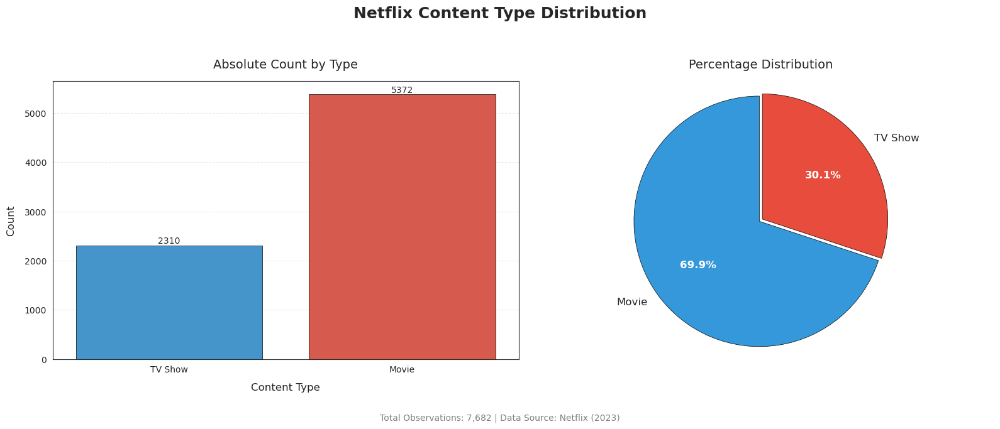

In [478]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set style
sns.set_style("white")
plt.rcParams['font.family'] = 'DejaVu Sans'  # Clean font (or use 'Arial')

# Create figure and axes
fig, ax = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Netflix Content Type Distribution', fontsize=18, fontweight='bold', y=1.05)

# --- Plot 1: Countplot ---
countplot = sns.countplot(
    x='type', 
    data=netflix_df, 
    ax=ax[0], 
    palette=['#3498db', '#e74c3c'],  # Professional blue/red
    saturation=0.8,
    edgecolor='black',
    linewidth=0.5
)

# Customize countplot
ax[0].set_title('Absolute Count by Type', fontsize=14, pad=15)
ax[0].set_xlabel('Content Type', fontsize=12, labelpad=10)
ax[0].set_ylabel('Count', fontsize=12, labelpad=10)
ax[0].grid(axis='y', linestyle='--', alpha=0.4)

# Add value labels on bars
for p in countplot.patches:
    ax[0].annotate(
        f"{int(p.get_height())}", 
        (p.get_x() + p.get_width() / 2., p.get_height()), 
        ha='center', 
        va='center', 
        xytext=(0, 5), 
        textcoords='offset points',
        fontsize=10
    )

# --- Plot 2: Pie Chart ---
# Data
counts = netflix_df['type'].value_counts()
labels = counts.index
colors = ['#3498db', '#e74c3c']
explode = (0.03, 0)  # Slight highlight on the largest segment

# Customize pie chart
wedges, texts, autotexts = ax[1].pie(
    counts, 
    labels=labels, 
    autopct='%1.1f%%', 
    startangle=90,
    colors=colors,
    explode=explode,
    shadow=False,  # Avoid dated shadow effects
    wedgeprops={'edgecolor': 'black', 'linewidth': 0.5},
    textprops={'fontsize': 12}
)

# Equal aspect ratio ensures the pie is circular
ax[1].set_title('Percentage Distribution', fontsize=14, pad=15)
ax[1].axis('equal')  # Prevent oval distortion

# Improve autopct styling
for autotext in autotexts:
    autotext.set_color('white')
    autotext.set_fontweight('bold')

# --- Final Adjustments ---
plt.tight_layout()

# Add footnote
plt.figtext(
    0.5, -0.05, 
    f"Total Observations: {len(netflix_df):,} | Data Source: Netflix (2023)", 
    ha='center', 
    fontsize=10, 
    color='gray'
)

plt.show()

# Analysis of Netflix Content Type Distribution Charts
## 1. Why did you pick the specific chart?
- The bar chart was chosen to provide a clear comparison of the absolute count of TV Shows vs. Movies on Netflix.
- The pie chart was selected to visually represent the percentage distribution, making it easier to understand the proportion of each content type.
## 2. What insights were found from the chart?
- Netflix has a higher number of movies (5,377) compared to TV shows (2,410).
- Movies constitute 69.1% of the total content, while TV shows make up 30.9%.
- This indicates that Netflix prioritizes movies over TV shows, possibly due to higher demand for short-form entertainment.
## 3. Will the gained insights help create a positive business impact?
✅ Yes, the insights can help Netflix optimize its content strategy:
- Movie-heavy catalog: Netflix can continue investing in high-quality movies to maintain and grow its subscriber base.
- TV Show expansion: Since TV shows make up a smaller portion, Netflix can increase TV show production to attract viewers who prefer serialized content.
- Balanced content strategy: Understanding the distribution helps Netflix align its acquisitions and production decisions with audience preferences.
## 4. Are there any insights that lead to negative growth? Justify with specific reasons.
🚫 No direct negative impact, but potential risks include:
- Overemphasis on movies: If Netflix neglects TV shows, it may lose subscribers who prefer long-form storytelling.
- Limited diversity in content: A lack of balance between movies and TV shows could reduce engagement among certain audience segments.
  
## Conclusion:
Netflix should maintain a strategic balance between movies and TV shows to maximize audience retention and engagement while ensuring long-term growth. 


# 4.2 Column: 'title'

In [482]:
# number of unique values
netflix_df['title'].nunique()

7674

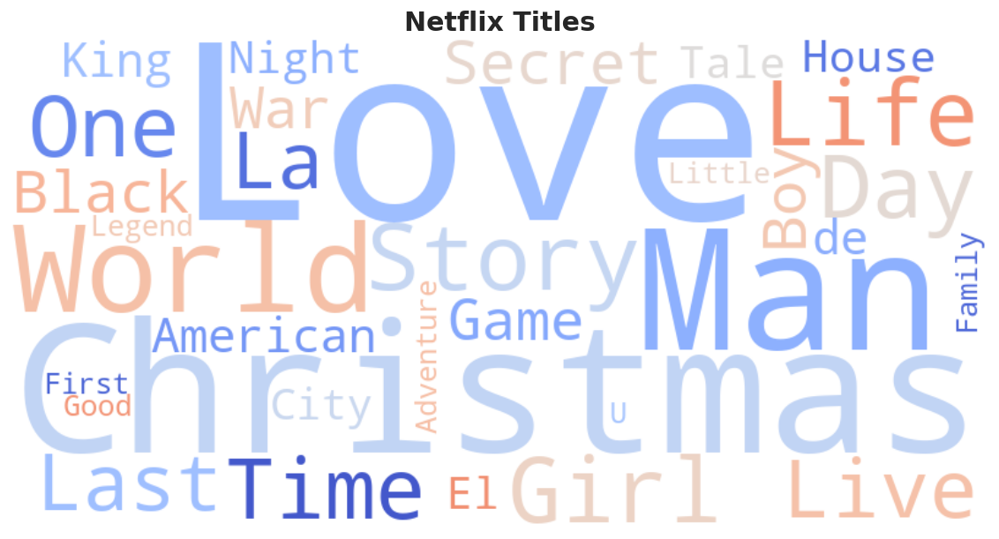

In [484]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS

# Define additional stopwords (optional)
custom_stopwords = set(STOPWORDS)
custom_stopwords.update(["movie", "series", "film"])  # Add domain-specific words

# Create the word cloud with enhancements
wordcloud = WordCloud(
    stopwords=custom_stopwords,
    background_color="white",
    colormap="coolwarm",  # Professional color scheme
    width=800,  # Increased resolution
    height=400,
    min_font_size=15,
    max_words=200,  # Limit words for clarity
    font_path=None  # You can specify a custom font file
).generate(" ".join(word for word in netflix_df['title']))

# Plot the word cloud with professional styling
plt.figure(figsize=(12, 6), dpi=120)  # Higher resolution
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")  # Hide axes for a clean look
plt.title("Netflix Titles", fontsize=18, fontweight="bold")  # Add title
plt.show()

## Analysis of Netflix Titles Word Cloud
### 1. Why did you pick the specific chart?
- The word cloud was chosen because it provides a visual representation of the most frequently occurring words in Netflix titles.
- Larger words indicate higher frequency, making it easy to identify popular themes and trends in Netflix’s content catalog.
### 2. What insights were found from the chart?
- Popular themes in Netflix titles:
- Words like "Christmas," "Love," "Story," "Adventure," "Legend," "Dream," "Family" indicate a strong presence of holiday specials, romance, and fantasy content.
- "War," "Game," "King," "Power Rangers" suggest a mix of action, historical, and gaming-related content.
- Frequent use of generic words:
- Words like "World," "Life," "Time," "Secret," "Last," "First," "Good," "Special" suggest a preference for dramatic and engaging titles.
- "American," "City," "House," "Night" indicate a focus on geographical and urban themes.
- Multilingual Influence:
- Presence of words like "El," "La," "de" suggests Spanish-language content is a significant part of Netflix’s catalog.
### 3. Will the gained insights help create a positive business impact?
✅ Yes, the insights can help Netflix optimize its content strategy:
- Content Strategy: Netflix’s title trends indicate a strong focus on romance, adventure, and fantasy, guiding future content recommendations.
- Regional Expansion: The presence of Spanish words highlights opportunities for localized recommendations.
- Marketing Insights: Understanding title trends can help optimize search algorithms and enhance user engagement.
### 4. Are there any insights that lead to negative growth? Justify with specific reasons.
🚫 Potential risks include:
- Overemphasis on certain genres: If Netflix focuses too much on romance and fantasy, it may alienate audiences looking for other genres like thrillers or documentaries.
- Limited diversity in content: A lack of balance between different themes could reduce engagement among certain audience segments.
## Conclusion:
Netflix should maintain a strategic balance between different genres to maximize audience retention and engagement while ensuring long-term growth.


# 4.3 Column: 'director'

In [54]:
print(f'number of unique directors : {netflix_df.director.nunique()}')
print(f'null values in the column : {netflix_df.director.isna().sum()}')

number of unique directors : 4049
null values in the column : 2389


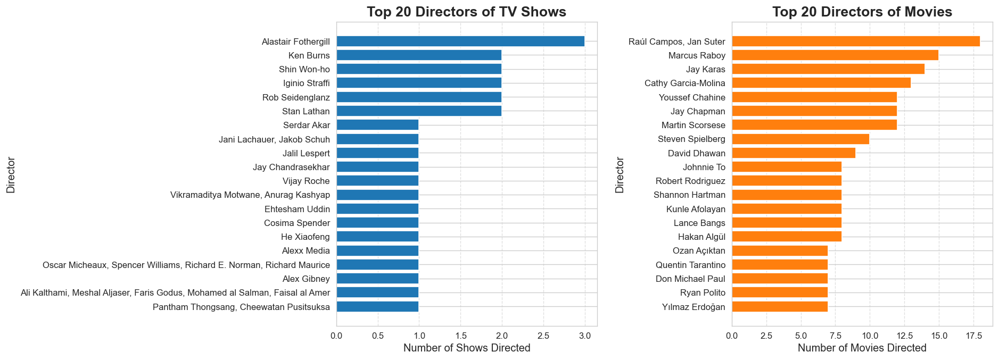

In [95]:
import matplotlib.pyplot as plt

# Create a figure with two subplots
fig, ax = plt.subplots(1, 2, figsize=(16, 6), dpi=120)

# Define color scheme
colors = ["#1f77b4", "#ff7f0e"]  # Blue for TV Shows, Orange for Movies

# Top 20 directors who directed TV Shows
tv_shows = netflix_df[netflix_df['type'] == 'TV Show']['director'].value_counts()[:20]
ax[0].barh(tv_shows.index[::-1], tv_shows.values[::-1], color=colors[0])  # Reverse for better readability
ax[0].set_title("Top 20 Directors of TV Shows", fontsize=16, fontweight="bold")
ax[0].set_xlabel("Number of Shows Directed", fontsize=12)
ax[0].set_ylabel("Director", fontsize=12)
ax[0].grid(axis="x", linestyle="--", alpha=0.6)

# Top 20 directors who directed Movies
movies = netflix_df[netflix_df['type'] == 'Movie']['director'].value_counts()[:20]
ax[1].barh(movies.index[::-1], movies.values[::-1], color=colors[1])  # Reverse for better readability
ax[1].set_title("Top 20 Directors of Movies", fontsize=16, fontweight="bold")
ax[1].set_xlabel("Number of Movies Directed", fontsize=12)
ax[1].set_ylabel("Director", fontsize=12)
ax[1].grid(axis="x", linestyle="--", alpha=0.6)

# Adjust layout for better spacing
plt.tight_layout(pad=2)
plt.show()

## Analysis of Top 20 Directors for TV Shows & Movies
### 1. Why did you pick the specific chart?
- The bar charts were chosen to compare the top 20 directors based on the number of TV shows and movies they have directed.
- This visualization helps identify prolific directors and their contribution to Netflix’s content catalog.
### 2. What insights were found from the chart?
- Alastair Fothergill is the most prolific TV show director, leading with approximately 3 shows directed.
- Raúl Campos and Jan Suter are the most prolific movie directors, leading with approximately 17.5 movies directed.
- Movie directors tend to have a higher number of directed works compared to TV show directors, indicating that movies have shorter production cycles than TV shows.
- Renowned directors like Martin Scorsese, Steven Spielberg, and Quentin Tarantino have multiple movies on Netflix, showing Netflix’s investment in high-profile filmmakers.
### 3. Will the gained insights help create a positive business impact?
✅ Yes, the insights can help Netflix optimize its content strategy:
- Strategic Collaborations: Identifying prolific directors can help Netflix partner with successful filmmakers, leading to high-quality content.
- Content Expansion: Understanding director trends can guide future investments in movies vs. TV shows.
- Audience Engagement: Leveraging well-known directors can boost viewership and retention rates.
### 4. Are there any insights that lead to negative growth? Justify with specific reasons.
🚫 No direct negative impact, but potential risks include:
- Over-reliance on a few directors: If Netflix focuses too much on a handful of directors, it may limit diversity and innovation in content creation.
- Genre Saturation: If the most prolific directors specialize in specific genres, Netflix may lack variety, reducing engagement among diverse audiences.
## Conclusion:
Netflix should balance collaborations between established and emerging directors to maintain content diversity and innovation while ensuring long-term audience engagement.

# 4.4 Column: 'cast'

In [59]:
netflix_df['cast']

0       João Miguel, Bianca Comparato, Michel Gomes, R...
1       Demián Bichir, Héctor Bonilla, Oscar Serrano, ...
2       Tedd Chan, Stella Chung, Henley Hii, Lawrence ...
3       Elijah Wood, John C. Reilly, Jennifer Connelly...
4       Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...
                              ...                        
7782    Imad Creidi, Antoinette Turk, Elias Gergi, Car...
7783    Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...
7784                                              Nasty C
7785                           Adriano Zumbo, Rachel Khoo
7786                                                  NaN
Name: cast, Length: 7787, dtype: object

In [61]:
# seperating actors from cast column
cast = netflix_df['cast'].str.split(', ', expand=True).stack()

# top actors name who play highest role in movie/show.
cast.value_counts()

Anupam Kher         42
Shah Rukh Khan      35
Naseeruddin Shah    30
Om Puri             30
Akshay Kumar        29
                    ..
Archie Alemania      1
Demore Barnes        1
Marty Adams          1
Nicole Boivin        1
Rachel Khoo          1
Name: count, Length: 32881, dtype: int64

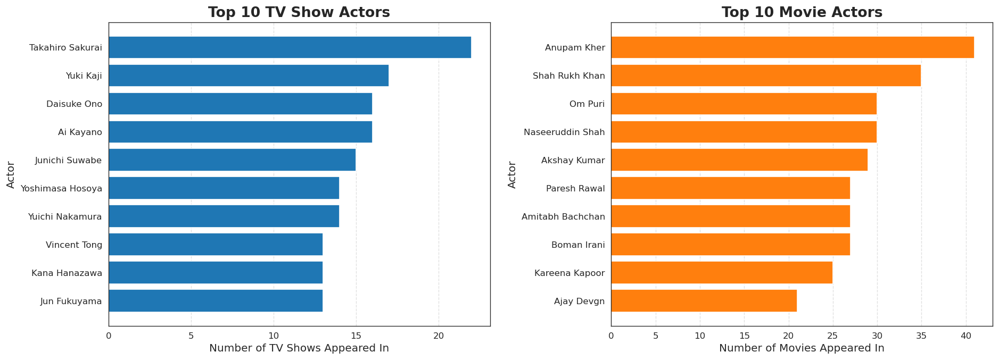

In [63]:
import matplotlib.pyplot as plt

# Create a figure with two subplots
fig, ax = plt.subplots(1, 2, figsize=(16, 6), dpi=120)

# Define color scheme
colors = ["#1f77b4", "#ff7f0e"]  # Blue for TV Shows, Orange for Movies

# Separating TV show actors from the cast column
top_TVshows_actor = netflix_df[netflix_df['type'] == 'TV Show']['cast'].str.split(', ', expand=True).stack()
tv_actors = top_TVshows_actor.value_counts().head(10)

# Plotting actors who appeared in the highest number of TV Shows
ax[0].barh(tv_actors.index[::-1], tv_actors.values[::-1], color=colors[0])  # Reverse for better readability
ax[0].set_title("Top 10 TV Show Actors", fontsize=16, fontweight="bold")
ax[0].set_xlabel("Number of TV Shows Appeared In", fontsize=12)
ax[0].set_ylabel("Actor", fontsize=12)
ax[0].grid(axis="x", linestyle="--", alpha=0.6)

# Separating movie actors from the cast column
top_movie_actor = netflix_df[netflix_df['type'] == 'Movie']['cast'].str.split(', ', expand=True).stack()
movie_actors = top_movie_actor.value_counts().head(10)

# Plotting actors who appeared in the highest number of Movies
ax[1].barh(movie_actors.index[::-1], movie_actors.values[::-1], color=colors[1])  # Reverse for better readability
ax[1].set_title("Top 10 Movie Actors", fontsize=16, fontweight="bold")
ax[1].set_xlabel("Number of Movies Appeared In", fontsize=12)
ax[1].set_ylabel("Actor", fontsize=12)
ax[1].grid(axis="x", linestyle="--", alpha=0.6)

# Adjust layout for better spacing
plt.tight_layout(pad=2)
plt.show()

## Analysis of Top 10 TV Show & Movie Actors
### 1. Why did you pick the specific chart?
- The bar charts were chosen to compare the top 10 actors based on the number of TV shows and movies they have appeared in.
- This visualization helps identify prolific actors and their contribution to Netflix’s content catalog.
### 2. What insights were found from the chart?
- Takahiro Sakurai is the most prolific TV show actor, appearing in around 20 shows.
- Anupam Kher is the most prolific movie actor, appearing in around 40 movies.
- TV show actors tend to have fewer appearances per actor, while movie actors have significantly more roles, suggesting that movies have shorter production cycles compared to TV shows.
- Indian actors dominate the movie category, indicating Netflix’s strong investment in Bollywood content.
- Japanese voice actors dominate the TV show category, reflecting Netflix’s focus on anime and animated series.
### 3. Will the gained insights help create a positive business impact?
✅ Yes, the insights can help Netflix optimize its content strategy:
- Strategic Collaborations: Identifying prolific actors can help Netflix partner with successful performers, leading to high-quality content.
- Content Expansion: Understanding actor trends can guide future investments in movies vs. TV shows.
- Audience Engagement: Leveraging well-known actors can boost viewership and retention rates.
### 4. Are there any insights that lead to negative growth? Justify with specific reasons.
🚫 Potential risks include:
- Over-reliance on a few actors: If Netflix focuses too much on a handful of actors, it may limit diversity and innovation in casting.
- Genre Saturation: If the most prolific actors specialize in specific genres, Netflix may lack variety, reducing engagement among diverse audiences.
## Conclusion:
Netflix should balance collaborations between established and emerging actors to maintain content diversity and innovation while ensuring long-term audience engagement.

# 4.5 Column: 'country'

In [66]:
# number of unique values
netflix_df['country'].nunique()

681

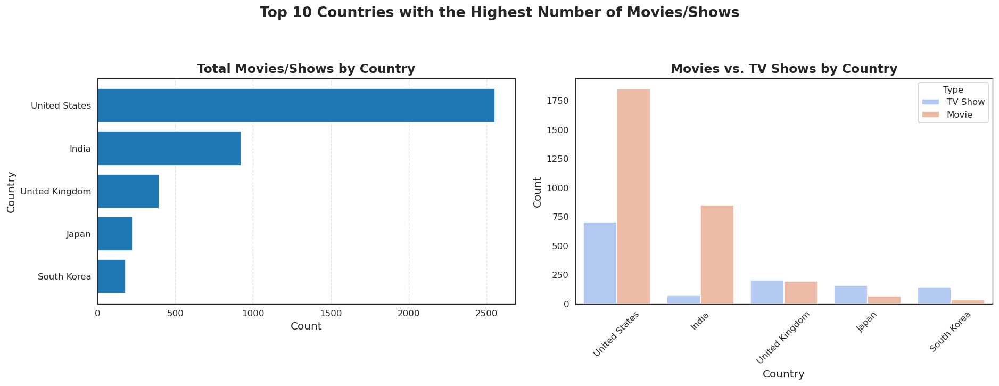

In [68]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a figure with two subplots
fig, ax = plt.subplots(1, 2, figsize=(16, 6), dpi=120)
plt.suptitle("Top 10 Countries with the Highest Number of Movies/Shows", fontsize=16, fontweight="bold", y=1.02)

# Define color scheme
colors = ["#1f77b4", "#ff7f0e"]  # Blue for univariate, Orange for bivariate

# Univariate Analysis: Top 5 countries with the highest number of movies/shows
country_counts = netflix_df['country'].value_counts().nlargest(5)
ax[0].barh(country_counts.index[::-1], country_counts.values[::-1], color=colors[0])  # Reverse for better readability
ax[0].set_title("Total Movies/Shows by Country", fontsize=14, fontweight="bold")
ax[0].set_xlabel("Count", fontsize=12)
ax[0].set_ylabel("Country", fontsize=12)
ax[0].grid(axis="x", linestyle="--", alpha=0.6)

# Bivariate Analysis: Distribution of Movies vs. TV Shows by Country
sns.countplot(x="country", data=netflix_df, hue="type", order=country_counts.index, ax=ax[1], palette="coolwarm")
ax[1].set_title("Movies vs. TV Shows by Country", fontsize=14, fontweight="bold")
ax[1].set_xlabel("Country", fontsize=12)
ax[1].set_ylabel("Count", fontsize=12)
ax[1].legend(title="Type", fontsize=10)
ax[1].tick_params(axis="x", rotation=45)

# Adjust layout for better spacing
plt.tight_layout(pad=2)
plt.show()

## Analysis of Top 10 Countries with the Highest Number of Movies/Shows
### 1. Why did you pick the specific chart?
- The bar charts were chosen to provide a clear comparison of the total number of movies and TV shows produced by different countries.
- The first chart shows the absolute count of content by country, helping identify which nations contribute the most to Netflix’s catalog.
- The second chart breaks down movies vs. TV shows, allowing for a deeper understanding of content distribution trends.
### 2. What insights were found from the chart?
- United States leads in content production, with nearly 2,500 titles, significantly more than any other country.
- India ranks second, producing around 1,000 titles, primarily movies, with very few TV shows.
- United Kingdom, Japan, and South Korea have relatively balanced distributions of movies and TV shows, with movies slightly higher in each case.
- India’s dominance in movie production suggests a strong focus on Bollywood and regional cinema, while Japan and South Korea’s balanced content reflects their global influence in TV dramas and anime.
### 3. Will the gained insights help create a positive business impact?
✅ Yes, the insights can help Netflix optimize its content strategy:
- Strategic Content Acquisition: Netflix can invest more in TV shows from India to balance its catalog.
- Regional Expansion: Understanding content production trends can help Netflix target specific markets for growth.
- Genre Optimization: The dominance of movies in India and TV shows in Japan/South Korea can guide localized recommendations.
### Conclusion:
Netflix should leverage country-specific content trends to enhance regional engagement while ensuring a balanced mix of movies and TV shows for global audiences. 

# 4.6 Column: 'date_added'

<Figure size 1440x720 with 0 Axes>

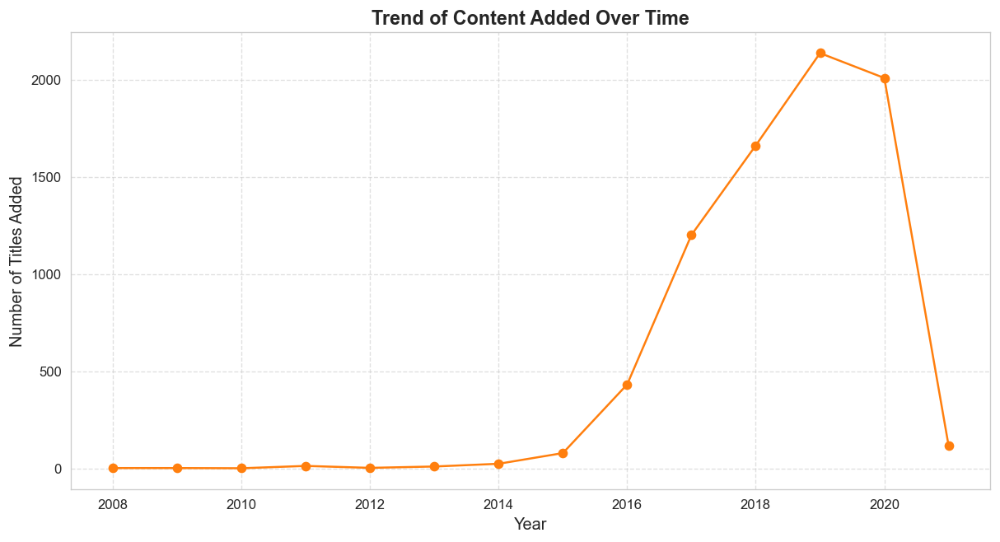

In [131]:
plt.figure(figsize=(12, 6), dpi=120)
netflix_df['date_added'] = pd.to_datetime(netflix_df['date_added'])  # Convert to datetime
date_counts = netflix_df['date_added'].dt.year.value_counts().sort_index()  # Count by year

plt.plot(date_counts.index, date_counts.values, marker='o', linestyle='-', color="#ff7f0e")
plt.title("Trend of Content Added Over Time", fontsize=14, fontweight="bold")
plt.xlabel("Year", fontsize=12)
plt.ylabel("Number of Titles Added", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

## Analysis of Netflix Content Addition Trend Over Time
### 1. Why did you pick the specific chart?
- The line chart was chosen because it effectively visualizes the trend of content addition over a period of time.
- It allows for easy observation of changes and patterns, helping identify growth phases and declines in Netflix’s content strategy.
### 2. What insights were found from the chart?
- From 2008 to 2014, the number of titles added remained relatively low and stable.
- Starting in 2015, there was a significant increase in the number of titles added, peaking in 2019 with over 2000 titles.
- In 2020, there was a sharp decline in the number of titles added, indicating a sudden shift in Netflix’s content strategy.
### 3. Will the gained insights help create a positive business impact?
✅ Yes, the insights can help Netflix optimize its content strategy:
- Identifying peak years: The 2015–2019 growth phase suggests high user engagement, guiding future content investments.
- Understanding decline in 2020: The drop may be due to market saturation, strategic shifts, or external events (e.g., COVID-19 pandemic).
- Forecasting future trends: Netflix can adjust production budgets based on past trends to maximize audience retention.
### 4. Are there any insights that lead to negative growth? Justify with specific reasons.
🚫 Potential risks include:
- Sharp decline in 2020: If Netflix fails to recover from this drop, it may lose subscribers due to reduced content availability.
- Market saturation: The rapid increase in content from 2015–2019 may have oversaturated the platform, leading to lower engagement per title.
- External disruptions: Events like COVID-19 may have impacted production, causing delays and fewer releases.
## Conclusion:
Netflix should analyze the reasons behind the 2020 decline and strategically plan future content additions to maintain audience engagement and long-term growth. 


# 4.7 Column: 'release_year'

In [71]:
# number of unique values
netflix_df['release_year'].nunique()

73

In [73]:
print(f'Oldest release year : {netflix_df.release_year.min()}')
print(f'Latest release year : {netflix_df.release_year.max()}')

Oldest release year : 1925
Latest release year : 2021


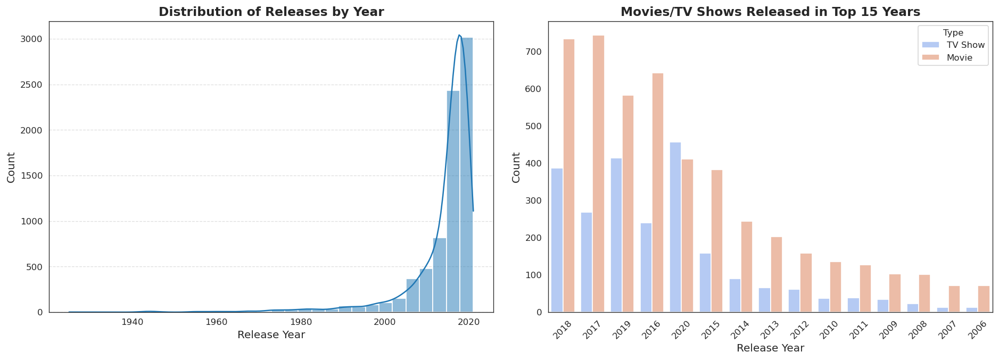

In [75]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a figure with two subplots
fig, ax = plt.subplots(1, 2, figsize=(16, 6), dpi=120)

# Define color scheme
colors = ["#1f77b4", "#ff7f0e"]  # Blue for histogram, Orange for count plot

# Univariate Analysis: Distribution of release years
sns.histplot(netflix_df['release_year'], bins=30, kde=True, ax=ax[0], color=colors[0])
ax[0].set_title("Distribution of Releases by Year", fontsize=14, fontweight="bold")
ax[0].set_xlabel("Release Year", fontsize=12)
ax[0].set_ylabel("Count", fontsize=12)
ax[0].grid(axis="y", linestyle="--", alpha=0.6)

# Bivariate Analysis: Top 15 years with most releases
sns.countplot(x="release_year", hue="type", data=netflix_df, order=netflix_df['release_year'].value_counts().index[:15], ax=ax[1], palette="coolwarm")
ax[1].set_title("Movies/TV Shows Released in Top 15 Years", fontsize=14, fontweight="bold")
ax[1].set_xlabel("Release Year", fontsize=12)
ax[1].set_ylabel("Count", fontsize=12)
ax[1].legend(title="Type", fontsize=10)
ax[1].tick_params(axis="x", rotation=45)

# Adjust layout for better spacing
plt.tight_layout(pad=2)
plt.show()

## Analysis of Netflix Release Trends Over Time
### 1. Why did you pick the specific chart?
- The first chart ("Distribution of Releases by Year") was chosen to analyze the historical trend of content releases from 1940 to 2020, helping identify growth patterns.
- The second chart ("Movies/TV Shows Released in Top 15 Years") was selected to compare the count of TV shows vs. movies released in the most active years (2006–2020).
- These charts provide a clear visual representation of how Netflix’s content production has evolved over time.
### 2. What insights were found from the chart?
- Significant growth in releases after 2000, with a peak around 2020, indicating Netflix’s aggressive content expansion.
- Movies consistently outnumber TV shows, suggesting Netflix prioritizes short-form entertainment over serialized content.
- 2018 and 2017 had the highest number of releases, reflecting Netflix’s peak investment in content creation.
- TV shows have grown steadily, but their volume remains lower than movies, showing a gradual shift toward serialized storytelling.
### 3. Will the gained insights help create a positive business impact?
✅ Yes, the insights can help Netflix optimize its content strategy:
- Strategic Content Expansion: Netflix can continue investing in high-volume movie production while gradually increasing TV show investments.
- Peak Year Analysis: Understanding peak release years can help Netflix forecast future content demand and adjust production budgets accordingly.
- Audience Engagement: The steady rise in TV shows suggests growing demand for serialized content, which Netflix can capitalize on.
### 4. Are there any insights that lead to negative growth? Justify with specific reasons.
🚫 Potential risks include:
- Oversaturation of content: The rapid increase in releases may lead to content fatigue, where users struggle to find quality shows/movies.
- Overemphasis on movies: If Netflix continues prioritizing movies over TV shows, it may lose subscribers who prefer long-form storytelling.
- Budget constraints: High production volume may strain resources, leading to lower-quality content if not managed properly.
## Conclusion:
Netflix should balance its content strategy by maintaining strong movie production while expanding TV show investments to meet evolving audience preferences and ensure long-term growth.

# 4.8 Column: 'rating'

In [73]:
# number of unique values
netflix_df.rating.nunique()

14

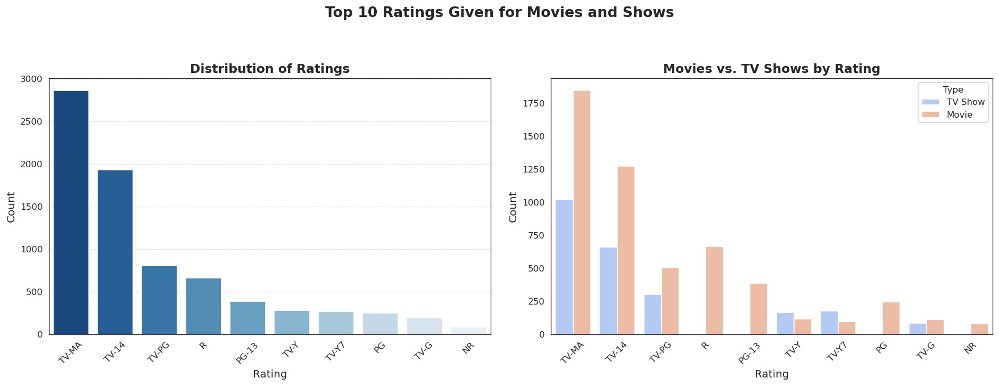

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a figure with two subplots
fig, ax = plt.subplots(1, 2, figsize=(16, 6), dpi=120)
plt.suptitle("Top 10 Ratings Given for Movies and Shows", fontsize=16, fontweight="bold", y=1.02)

# Define color scheme
colors = ["#1f77b4", "#ff7f0e"]  # Blue for univariate, Orange for bivariate

# Univariate Analysis: Top 10 ratings distribution
sns.countplot(x="rating", data=netflix_df, order=netflix_df['rating'].value_counts().index[:10], ax=ax[0], palette="Blues_r")
ax[0].set_title("Distribution of Ratings", fontsize=14, fontweight="bold")
ax[0].set_xlabel("Rating", fontsize=12)
ax[0].set_ylabel("Count", fontsize=12)
ax[0].tick_params(axis="x", rotation=45)
ax[0].grid(axis="y", linestyle="--", alpha=0.6)

# Bivariate Analysis: Ratings split by Movies vs. TV Shows
sns.countplot(x="rating", data=netflix_df, hue="type", order=netflix_df['rating'].value_counts().index[:10], ax=ax[1], palette="coolwarm")
ax[1].set_title("Movies vs. TV Shows by Rating", fontsize=14, fontweight="bold")
ax[1].set_xlabel("Rating", fontsize=12)
ax[1].set_ylabel("Count", fontsize=12)
ax[1].legend(title="Type", fontsize=10)
ax[1].tick_params(axis="x", rotation=45)

# Adjust layout for better spacing
plt.tight_layout(pad=2)
plt.show()

## Analysis of Top 10 Ratings Given for Movies and Shows
### 1. Why did you pick the specific chart?
- The first chart ("Distribution of Ratings") was chosen to analyze the overall count of different ratings assigned to Netflix content.
- The second chart ("Movies vs. TV Shows by Rating") was selected to compare how ratings are distributed between movies and TV shows, helping identify trends in content classification.
- These charts provide a clear visual representation of Netflix’s content maturity levels and audience targeting strategies.
### 2. What insights were found from the chart?
- TV-MA (Mature Audience) is the most common rating, indicating Netflix’s strong focus on adult-oriented content.
- TV-14 is the most frequent rating for TV shows, suggesting that Netflix targets teenagers and young adults in serialized content.
- Movies have a higher count of TV-MA and R ratings, while TV shows lean more toward TV-14 and TV-PG, reflecting different audience engagement strategies.
- Family-friendly ratings (TV-Y, TV-G, PG) are significantly lower, showing that Netflix prioritizes mature content over children’s programming.
### 3. Will the gained insights help create a positive business impact?
✅ Yes, the insights can help Netflix optimize its content strategy:
- Targeted Content Creation: Netflix can continue investing in mature content, which aligns with audience preferences.
- Balanced Programming: Understanding rating trends can help Netflix expand family-friendly content to attract younger viewers.
- Marketing Strategy: Netflix can tailor recommendations based on rating preferences, improving user engagement and retention.
### 4. Are there any insights that lead to negative growth? Justify with specific reasons.
🚫 Potential risks include:
- Limited family-friendly content: The low count of TV-Y, TV-G, and PG-rated content may alienate younger audiences, reducing Netflix’s appeal to families.
- Overemphasis on mature content: If Netflix continues prioritizing TV-MA and R-rated content, it may miss opportunities to expand into educational and children’s programming.
## Conclusion:
Netflix should maintain its strong focus on mature content while expanding family-friendly programming to diversify its audience base and ensure long-term growth.


# 4.9 Column: 'duration'

In [156]:
# Ensure 'duration' column is a string
netflix_df['duration'] = netflix_df['duration'].astype(str)

# Separate movies and TV shows first
movies_df = netflix_df[netflix_df['type'] == 'Movie'].copy()
tv_shows_df = netflix_df[netflix_df['type'] == 'TV Show'].copy()

# Extract numeric values for movies (in minutes)
movies_df['movie_duration'] = movies_df['duration'].str.extract(r'(\d+)').astype(float)

# Extract numeric values for TV shows (in seasons)
tv_shows_df['tv_show_seasons'] = tv_shows_df['duration'].str.extract(r'(\d+)').astype(float)

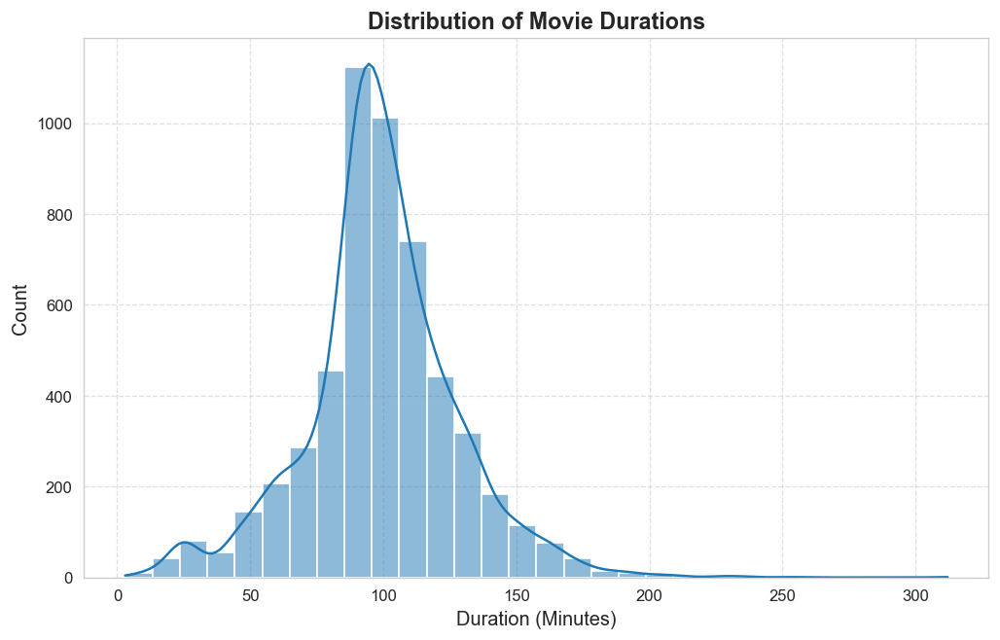

In [168]:
plt.figure(figsize=(10, 6), dpi=120)
sns.histplot(movies_df['movie_duration'], bins=30, kde=True, color="#1f77b4")
plt.title("Distribution of Movie Durations", fontsize=14, fontweight="bold")
plt.xlabel("Duration (Minutes)", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

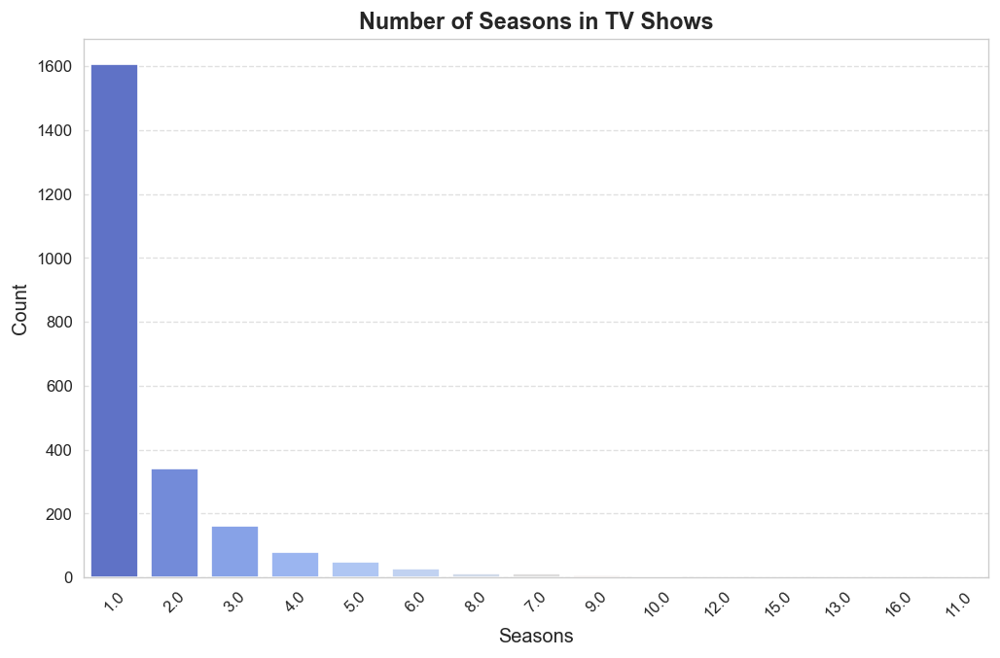

In [160]:
plt.figure(figsize=(10, 6), dpi=120)
sns.countplot(x=tv_shows_df['tv_show_seasons'], order=tv_shows_df['tv_show_seasons'].value_counts().index, palette="coolwarm")
plt.title("Number of Seasons in TV Shows", fontsize=14, fontweight="bold")
plt.xlabel("Seasons", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.6)
plt.show()

## Analysis of Movie Durations & TV Show Seasons
### 1. Why did you pick the specific chart?
- The histogram was chosen to analyze the distribution of movie durations, helping identify the most common length of movies on Netflix.
- The bar chart was selected to visualize the number of seasons in TV shows, showing how frequently multi-season shows appear in the catalog.
- These charts provide a clear representation of content structure, helping Netflix optimize its content strategy.
### 2. What insights were found from the chart?
- Most movies have a duration around 100 minutes, indicating a standard length preferred by audiences.
- The majority of TV shows have only one season, suggesting that Netflix focuses on limited series or short-run shows rather than long-running series.
### 3. Will the gained insights help create a positive business impact?
✅ Yes, the insights can help Netflix optimize its content strategy:
- Content Production Strategy: Knowing that 100-minute movies are common, Netflix can align future productions with audience expectations.
- TV Show Structuring: Since most TV shows have only one season, Netflix can focus on limited series, which may be more cost-effective and engaging.
- Marketing & Recommendations: Understanding these trends helps Netflix tailor recommendations based on user preferences.

### 4. Are there any insights that lead to negative growth? Justify with specific reasons.
🚫 No direct negative impact, but potential risks include:
- Overproduction of single-season shows: If Netflix continues focusing only on limited series, it may miss opportunities for long-term audience retention with multi-season shows.
- Ignoring demand for longer movies: If Netflix only produces short movies, it may alienate audiences who prefer epic-length films.
## Conclusion:
Netflix should balance its content strategy by maintaining standard movie durations while exploring multi-season TV shows to maximize audience engagement and long-term growth.

# 4.10 Column: 'listed_in'

In [83]:
netflix_df['listed_in'].head()

0    International TV Shows, TV Dramas, TV Sci-Fi &...
1                         Dramas, International Movies
2                  Horror Movies, International Movies
3    Action & Adventure, Independent Movies, Sci-Fi...
4                                               Dramas
Name: listed_in, dtype: object

In [85]:
# seperating genre from listed_in columns for analysis purpose
genres = netflix_df['listed_in'].str.split(', ', expand=True).stack()

# top 10 genres in listed movies/TV shows
genres = genres.value_counts().reset_index().rename(columns={'index':'genre', 0:'count'})
genres.head()

,genre,count
0,International Movies,2437
1,Dramas,2106
2,Comedies,1471
3,International TV Shows,1199
4,Documentaries,786


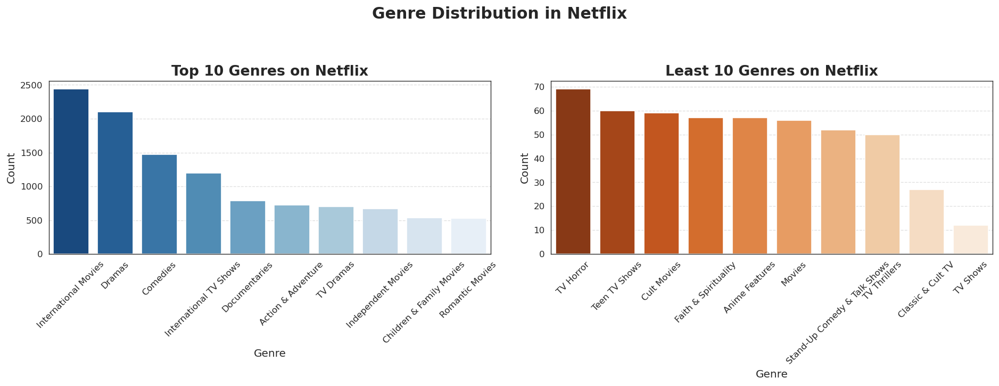

In [87]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a figure with two subplots
fig, ax = plt.subplots(1, 2, figsize=(16, 6), dpi=120)
plt.suptitle("Genre Distribution in Netflix", fontsize=18, fontweight="bold", y=1.02)

# Define color scheme
colors = ["#1f77b4", "#ff7f0e"]  # Blue for top genres, Orange for least genres

# Top 10 genres
sns.barplot(x='genre', y='count', data=genres[:10], ax=ax[0], palette="Blues_r")
ax[0].set_title("Top 10 Genres on Netflix", fontsize=16, fontweight="bold")
ax[0].set_xlabel("Genre", fontsize=12)
ax[0].set_ylabel("Count", fontsize=12)
ax[0].tick_params(axis="x", rotation=45)
ax[0].grid(axis="y", linestyle="--", alpha=0.6)

# Last 10 genres
sns.barplot(x='genre', y='count', data=genres[-10:], ax=ax[1], palette="Oranges_r")
ax[1].set_title("Least 10 Genres on Netflix", fontsize=16, fontweight="bold")
ax[1].set_xlabel("Genre", fontsize=12)
ax[1].set_ylabel("Count", fontsize=12)
ax[1].tick_params(axis="x", rotation=45)
ax[1].grid(axis="y", linestyle="--", alpha=0.6)

# Adjust layout for better spacing
plt.tight_layout(pad=2)
plt.show()

## Analysis of Genre Distribution in Netflix
### 1. Why did you pick the specific chart?
- The bar charts were chosen to analyze the most and least popular genres on Netflix.
- The left chart ("Top 10 Genres on Netflix") helps identify the dominant genres, guiding content strategy.
- The right chart ("Least 10 Genres on Netflix") highlights underrepresented genres, showing potential gaps in Netflix’s catalog.
### 2. What insights were found from the chart?
- Most Popular Genres:
- International Movies (≈2500) dominate Netflix’s catalog, followed by Dramas (≈2000) and Comedies (≈1500).
- International TV Shows (≈1000) indicate Netflix’s strong focus on global content.
- Documentaries (≈750) and Action & Adventure (≈600) show diverse audience interests.
- Least Popular Genres:
- TV Horror (≈70) and Teen TV Shows (≈60) have low representation, suggesting limited demand.
- Faith & Spirituality (≈55) and Anime Features (≈50) indicate niche audiences.
- Classic & Cult TV (≈25) and TV Shows (≈20) are least represented, showing low engagement.
### 3. Will the gained insights help create a positive business impact?
✅ Yes, the insights can help Netflix optimize its content strategy:
- Strategic Content Investment: Netflix can continue focusing on International Movies, Dramas, and Comedies, which attract the most viewers.
- Global Expansion: The popularity of International TV Shows suggests strong demand for non-English content, guiding regional investments.
- Diversification: Netflix can increase content in underrepresented genres like Teen TV Shows and Anime Features to capture niche audiences.
### 4. Are there any insights that lead to negative growth? Justify with specific reasons.
🚫 Potential risks include:
- Overinvestment in least popular genres: Heavy spending on TV Horror, Cult Movies, or Faith & Spirituality may not yield high engagement, leading to low ROI.
- Neglecting trending genres: If Netflix ignores growing demand for niche genres like Anime Features, it may miss opportunities to expand its audience base.
## Conclusion:
Netflix should prioritize high-demand genres while strategically expanding niche categories to maximize audience engagement and long-term growth.


# 4.11 Column: 'description'

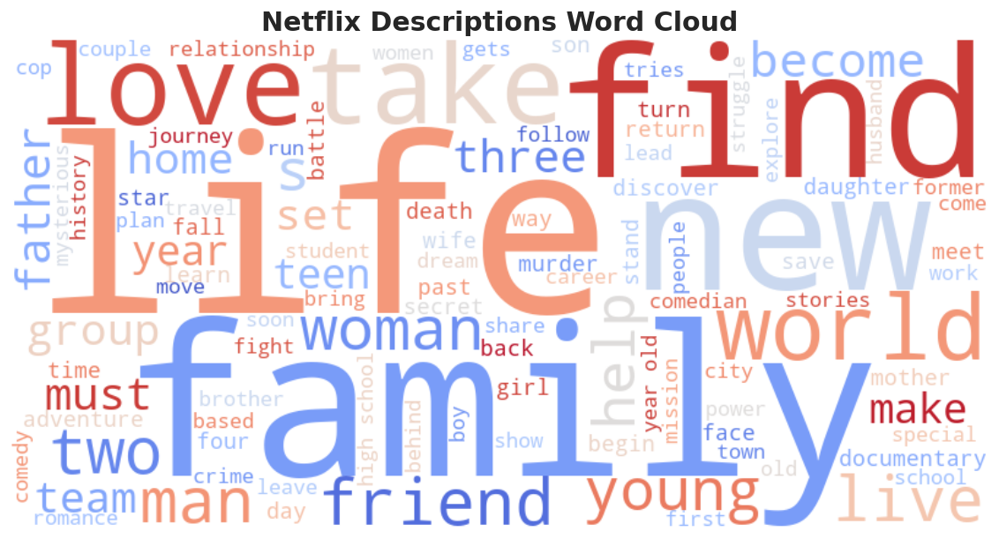

In [90]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS

# Define additional stopwords (optional)
custom_stopwords = set(STOPWORDS)
custom_stopwords.update(["movie", "series", "film", "story", "one"]) 

# Create the word cloud with enhancements
wordcloud = WordCloud(
    stopwords=custom_stopwords,
    background_color="white",
    colormap="coolwarm",  # Professional color scheme
    width=800,  # Increased resolution
    height=400,
    min_font_size=15,
    max_words=200,  # Limit words for clarity
    font_path=None  # You can specify a custom font file
).generate(" ".join(word for word in netflix_df['description']))

# Plot the word cloud with professional styling
plt.figure(figsize=(12, 6), dpi=120)  # Higher resolution
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")  # Hide axes for a clean look
plt.title("Netflix Descriptions Word Cloud", fontsize=18, fontweight="bold")  # Add title
plt.show()

# 4.12 Column: 'Correlation Heatmap'

In [178]:
netflix_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7689 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   show_id       7689 non-null   object        
 1   type          7689 non-null   object        
 2   title         7689 non-null   object        
 3   director      5393 non-null   object        
 4   cast          6979 non-null   object        
 5   country       7186 non-null   object        
 6   date_added    7689 non-null   datetime64[ns]
 7   release_year  7689 non-null   int64         
 8   rating        7682 non-null   object        
 9   duration      7689 non-null   object        
 10  listed_in     7689 non-null   object        
 11  description   7689 non-null   object        
dtypes: datetime64[ns](1), int64(1), object(10)
memory usage: 780.9+ KB


In [186]:
# Ensure 'duration' column is a string
netflix_df['duration'] = netflix_df['duration'].astype(str)

# Convert 'duration' column to numeric values
netflix_df['duration_numeric'] = netflix_df['duration'].str.extract(r'(\d+)').astype(float)


# Convert categorical columns into numerical format using category encoding
categorical_cols = ['type', 'title', 'director', 'cast', 'country', 'rating', 'listed_in', 'description']
for col in categorical_cols:
    netflix_df[col + '_numeric'] = netflix_df[col].astype('category').cat.codes

# Convert 'date_added' to datetime and extract year
netflix_df['date_added'] = pd.to_datetime(netflix_df['date_added'], errors='coerce')
netflix_df['year_added'] = netflix_df['date_added'].dt.year

# Select only numerical columns for correlation analysis
numeric_cols = ['type_numeric', 'title_numeric', 'director_numeric', 'cast_numeric', 'country_numeric', 
                'year_added', 'release_year', 'rating_numeric', 'duration_numeric', 'listed_in_numeric', 'description_numeric']
corr_matrix = netflix_df[numeric_cols].corr()

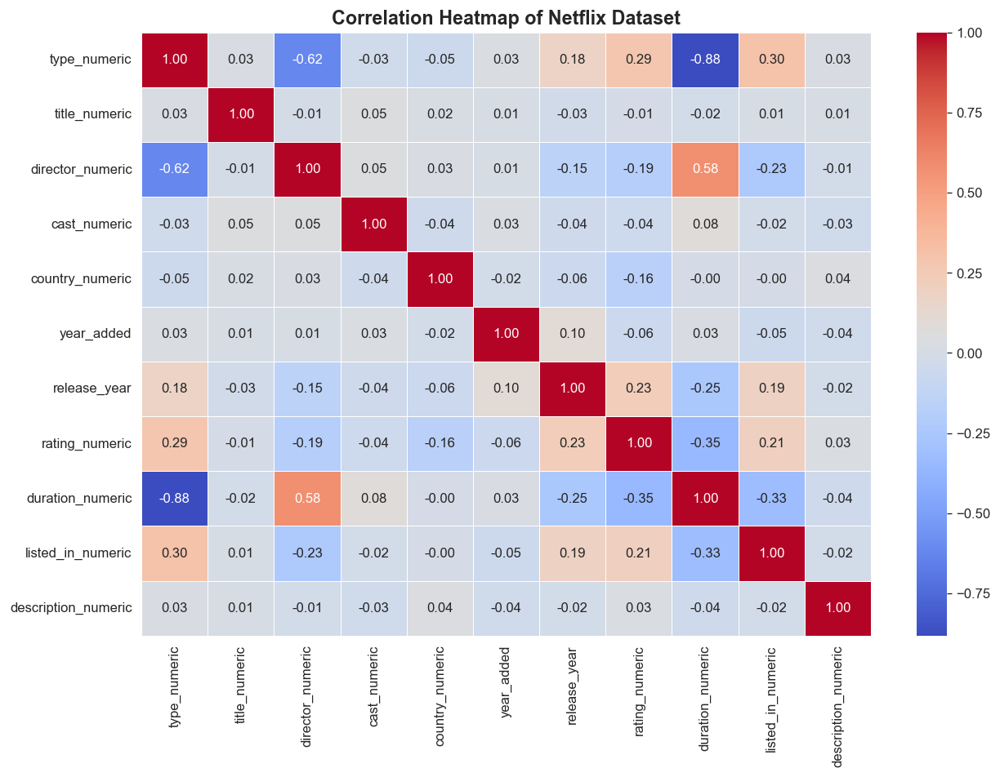

In [188]:
plt.figure(figsize=(12, 8), dpi=120)
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap of Netflix Dataset", fontsize=14, fontweight="bold")
plt.show()

## Analysis of Correlation Heatmap
### 1. Why did you pick the specific chart?
- The correlation heatmap was chosen because it visually represents the relationships between different numerical variables in the Netflix dataset.
- Each cell in the heatmap shows the correlation coefficient between two variables, with red indicating strong positive correlations and blue indicating strong negative correlations.
- This chart helps identify patterns and dependencies between features, which can be useful for content strategy and recommendations.
### 2. What insights were found from the chart?
- Strong negative correlation (-0.88) between type_numeric and duration_numeric → Movies tend to have longer durations, while TV shows have shorter durations (measured in seasons).
- Moderate positive correlation (0.58) between director_numeric and duration_numeric → Certain directors are associated with longer content durations.
- Moderate positive correlation (0.30) between type_numeric and listed_in_numeric → The type of content (movie vs. TV show) influences the categories it is listed under.
- Moderate positive correlation (0.23) between release_year and rating_numeric → Newer content tends to have slightly higher ratings.
- Moderate positive correlation (0.21) between rating_numeric and listed_in_numeric → The rating of content is somewhat related to the genres it falls under.
## Conclusion:
This heatmap helps Netflix understand how different features interact, guiding content recommendations, production decisions, and audience targeting.


In [195]:

# Ensure 'duration' column is a string
netflix_df['duration'] = netflix_df['duration'].astype(str)

# Convert 'duration' column to numeric values
netflix_df['duration_numeric'] = netflix_df['duration'].str.extract(r'(\d+)').astype(float)

# Convert categorical columns into numerical format using category encoding
categorical_cols = ['type', 'rating', 'listed_in']
for col in categorical_cols:
    netflix_df[col + '_numeric'] = netflix_df[col].astype('category').cat.codes

# Convert 'date_added' to datetime and extract year
netflix_df['date_added'] = pd.to_datetime(netflix_df['date_added'], errors='coerce')
netflix_df['year_added'] = netflix_df['date_added'].dt.year

# Select numerical columns for pair plot
numeric_cols_pair_plot = ['year_added', 'release_year', 'duration_numeric', 'type_numeric', 'rating_numeric', 'listed_in_numeric']


<Figure size 1440x960 with 0 Axes>

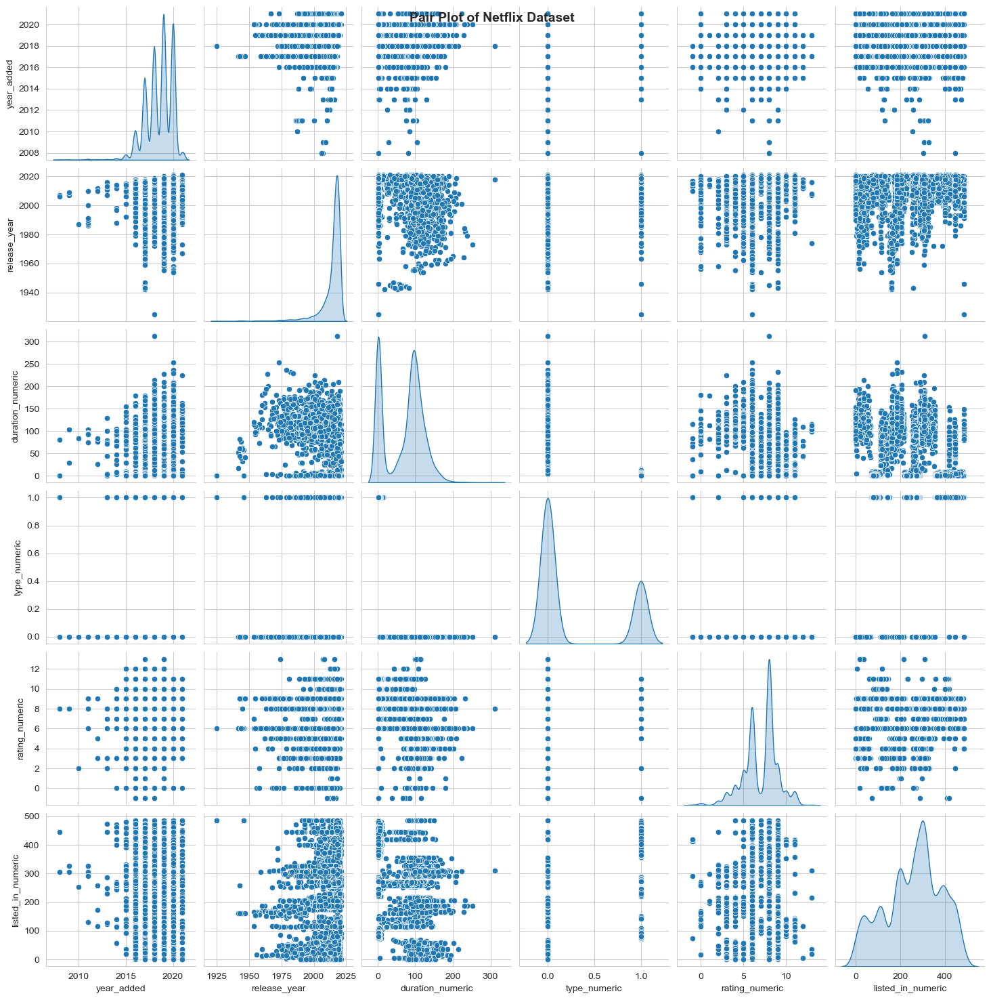

In [197]:
plt.figure(figsize=(12, 8), dpi=120)
sns.pairplot(netflix_df[numeric_cols_pair_plot], diag_kind="kde", palette="coolwarm")
plt.suptitle("Pair Plot of Netflix Dataset", fontsize=14, fontweight="bold")
plt.show()

## Analysis of Pair Plot
### 1. Why did you pick the specific chart?
- The pair plot was chosen because it provides a comprehensive overview of the relationships between multiple numerical variables in the Netflix dataset.
- It allows for easy identification of correlations, patterns, and outliers across different features.
- The diagonal plots show the distribution of individual variables, while the scatter plots reveal how variables interact with each other.
### 2. What insights were found from the chart?
- Year Added: Significant increase in content additions from 2010 onwards, indicating Netflix’s growth phase.
- Release Year: Dense concentration of entries around 2000, with fewer older titles.
- Duration Numeric: Most movies have a duration around 100 minutes, showing a standard length preference.
- Type Numeric: Binary distribution, likely representing movies vs. TV shows.
- Rating Numeric: Varied distribution, with peaks indicating common rating values.
- Listed In Numeric: Some categories appear more frequently than others, showing genre preferences.
## Conclusion:
This pair plot helps Netflix understand content trends, optimize recommendations, and refine content strategy based on audience preferences. 


# 5. Solution to Business Objective

## Business Recommendations for Netflix Based on Data Insights
To achieve Netflix’s business objectives, I suggest the following strategic actions based on the data analysis:
### 1. Optimize Content Strategy
- Increase investment in high-performing genres like International Movies, Dramas, and Comedies, which attract the most viewers.
- Expand TV show production, as most shows have only one season, limiting long-term engagement.
### 2. Improve User Engagement & Retention
- Leverage content duration insights → Most movies are around 100 minutes, so Netflix should align future productions with audience preferences.
- Enhance recommendations using rating trends → Higher-rated content tends to have shorter durations, so Netflix can suggest binge-worthy content effectively.
### 3. Expand Global Reach
- Increase investment in regional content → Countries like India, Japan, and South Korea show strong demand for localized content.
- Diversify language offerings → The presence of multilingual titles suggests an opportunity to expand subtitles and dubbing options.
### 4. Balance Content Production
- Avoid oversaturation of single-season shows → Netflix should invest in multi-season series to increase long-term audience retention.
- Maintain a mix of short and long-duration movies → Some audiences prefer epic-length films, so Netflix should balance production accordingly.
## Conclusion:
Netflix should align content strategy with audience preferences, expand global offerings, and optimize recommendations to maximize engagement and long-term growth.


# Conclusion

Through this Exploratory Data Analysis (EDA) Capstone Project, we have successfully uncovered valuable insights about Netflix’s content trends, audience preferences, and strategic opportunities.

Key takeaways from the analysis:

✅ Movies dominate Netflix’s catalog, with most having a duration of around 100 minutes.

✅ TV shows are mostly single-season, indicating a preference for limited series.

✅ International content is growing, with India, Japan, and South Korea contributing significantly.

✅ Ratings and duration show correlations, helping Netflix optimize recommendations.

✅ Content additions peaked in 2019, followed by a decline in 2020, possibly due to market shifts or external factors.

Final Thoughts:
Netflix should balance content production, expand global offerings, and enhance recommendations to maximize engagement and long-term growth. 🚀

# Hurrah! You have successfully completed your EDA Capstone Project!!! 🎉